# AV Behavior with friction implementation in rainy weather

In [1]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats
from scipy.stats import norm, binom, poisson
from dtaidistance import dtw
import json

## Testing Parameters

In [2]:
weather_param = [[20,0,0,5,0,0,0,10,0],
        [20,20,20,5,0,20,5,20,0],
        [40,40,40,5,0,40,10,30,0],
        [60,60,60,5,0,60,15,40,0],
        [80,80,80,5,0,80,20,50,0],
        [100,100,100,5,0,100,30,70,0]] 

def calc_fric(weather_list):
    return np.exp(-0.916*weather_list[5]/100) * (1-weather_list[5]/100)**3 * 0.6 + 0.4 - 0.1*weather_list[2]/100

for i in range(len(weather_param)):
    friction_ratio = calc_fric(weather_param[i])
    weather_param[i] += [friction_ratio]

df = pd.DataFrame(weather_param, columns =["cloudiness","precipitation","precipitation_deposits","sun_altitude_angle","sun_azimuth_angle","wetness","fog_density","wind_intensity", "ice_thickness", "friction_ratio"],
) 
# df.index.name = 'Scenarios'
df

,cloudiness,precipitation,precipitation_deposits,sun_altitude_angle,sun_azimuth_angle,wetness,fog_density,wind_intensity,ice_thickness,friction_ratio
0,20,0,0,5,0,0,0,10,0,1.000000
1,20,20,20,5,0,20,5,20,0,0.635775
2,40,40,40,5,0,40,10,30,0,0.449842
3,60,60,60,5,0,60,15,40,0,0.362164
4,80,80,80,5,0,80,20,50,0,0.322307
5,100,100,100,5,0,100,30,70,0,0.300000


### With reduced friction

In [3]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [4]:
rel_path = "./Data/Ghost Cutin/Rainy Reduced Friction Exponential"
os.path.isdir(rel_path)

True

In [5]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-sunset_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-100_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-20_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-40_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-60_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-80_fi_ghost_cutin']

In [6]:
head = subfolders.pop(1)
subfolders.append(head)
subfolders

['route_highway_epoch24_clear-sunset_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-20_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-40_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-60_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-80_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-100_fi_ghost_cutin']

In [7]:
txt_lists_fric = [[] for i in range(6)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [8]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 19.275000287219882,
     'duration_system': 35.48889398574829,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [9]:
avg_complete_fric = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_fric}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-sunset_fi_ghost_cutin,1.0
1,route_highway_epoch24_rain-sunset-20_fi_ghost_cutin,1.0
2,route_highway_epoch24_rain-sunset-40_fi_ghost_cutin,1.0
3,route_highway_epoch24_rain-sunset-60_fi_ghost_cutin,1.0
4,route_highway_epoch24_rain-sunset-80_fi_ghost_cutin,1.0
5,route_highway_epoch24_rain-sunset-100_fi_ghost_cutin,1.0


In [10]:
count = 0

avg_score_fric = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_fric}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-sunset_fi_ghost_cutin,100.0
1,route_highway_epoch24_rain-sunset-20_fi_ghost_cutin,100.0
2,route_highway_epoch24_rain-sunset-40_fi_ghost_cutin,100.0
3,route_highway_epoch24_rain-sunset-60_fi_ghost_cutin,100.0
4,route_highway_epoch24_rain-sunset-80_fi_ghost_cutin,100.0
5,route_highway_epoch24_rain-sunset-100_fi_ghost_cutin,100.0


#### Setting up into list of DataFrames

In [11]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [12]:
df_array_fric = np.empty((6,100), dtype=object)

for i in range(len(df_array_fric)):
    for j in range((len(df_array_fric[i]))):
        df_array_fric[i][j] = pd.DataFrame()

In [13]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_fric[i][run_index] = df
            run_index += 1

./Data/Ghost Cutin/Rainy Reduced Friction Exponential\route_highway_epoch24_clear-sunset_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-20_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-40_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-60_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-80_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Reduced Friction Exponential\route_highway_epoch24_rain-sunset-100_fi_ghost_cutin


In [14]:
df_array_fric[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,5303814,0,0.900000,-0.016026,0.0,5303814,0,500.497261,198.767441,-95.832657,-499.788727,5303814,0,192.362411,-86.262680,0.576039,0.000000
1,5303815,0,0.900000,-0.004313,0.0,5303815,0,5.598742,195.567444,-90.832657,0.100000,5303815,0,192.362411,-86.262680,0.534733,0.000000
2,5303816,0,0.900000,-0.011572,0.0,5303816,0,5.595580,195.567444,-90.832657,0.095407,5303816,0,192.362411,-86.262680,0.487313,0.000000
3,5303817,0,0.900000,-0.006790,0.0,5303817,0,5.592744,195.567444,-90.832657,0.084691,5303817,0,192.362411,-86.262680,0.433781,0.000000
4,5303818,0,0.900000,-0.004773,0.0,5303818,0,5.590235,195.567444,-90.832657,0.067854,5303818,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785,5304599,0,0.393559,-0.004288,0.0,5304599,0,53.787699,192.575394,96.857330,-0.068181,5304599,0,193.190887,43.073174,-0.021112,8.940359
786,5304600,0,0.500356,-0.005387,0.0,5304600,0,53.896886,192.571426,97.189987,-0.068182,5304600,0,193.186768,43.296635,-0.021112,8.939707
787,5304601,0,0.298347,-0.004259,0.0,5304601,0,54.006296,192.567383,97.522812,-0.068183,5304601,0,193.182724,43.520042,-0.021110,8.937193
788,5304602,0,0.450115,-0.004200,0.0,5304602,0,54.115894,192.563309,97.855751,-0.068184,5304602,0,193.178787,43.743378,-0.021107,8.934379


In [15]:
df_array_fric[0][0]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
771    193.158905
772    193.155640
773    193.152634
774    193.149918
775    193.147476
Name: x, Length: 776, dtype: float64

### Without friction reduction

In [16]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [17]:
rel_path = "./Data/Ghost Cutin/Rainy Original/"
os.path.isdir(rel_path)

True

In [18]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-sunset_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-100_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-20_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-40_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-60_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-80_fi_ghost_cutin']

In [19]:
head = subfolders.pop(1)
subfolders.append(head)
subfolders

['route_highway_epoch24_clear-sunset_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-20_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-40_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-60_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-80_fi_ghost_cutin',
 'route_highway_epoch24_rain-sunset-100_fi_ghost_cutin']

In [20]:
txt_lists_fric = [[] for i in range(6)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [21]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 19.275000287219882,
     'duration_system': 35.04421281814575,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [22]:
avg_complete_orig = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_orig}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-sunset_fi_ghost_cutin,1.0
1,route_highway_epoch24_rain-sunset-20_fi_ghost_cutin,1.0
2,route_highway_epoch24_rain-sunset-40_fi_ghost_cutin,1.0
3,route_highway_epoch24_rain-sunset-60_fi_ghost_cutin,1.0
4,route_highway_epoch24_rain-sunset-80_fi_ghost_cutin,1.0
5,route_highway_epoch24_rain-sunset-100_fi_ghost_cutin,1.0


In [23]:
count = 0

avg_score_orig = [_] * 6

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_orig}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-sunset_fi_ghost_cutin,100.0
1,route_highway_epoch24_rain-sunset-20_fi_ghost_cutin,100.0
2,route_highway_epoch24_rain-sunset-40_fi_ghost_cutin,100.0
3,route_highway_epoch24_rain-sunset-60_fi_ghost_cutin,100.0
4,route_highway_epoch24_rain-sunset-80_fi_ghost_cutin,100.0
5,route_highway_epoch24_rain-sunset-100_fi_ghost_cutin,100.0


#### Setting up into list of DataFrames

In [24]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [25]:
df_array_orig = np.empty((6,100), dtype=object)

for i in range(len(df_array_orig)):
    for j in range((len(df_array_orig[i]))):
        df_array_orig[i][j] = pd.DataFrame()

In [26]:
rel_path = "./Data/Ghost Cutin/Rainy Original/"

In [27]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_orig[i][run_index] = df
            run_index += 1

./Data/Ghost Cutin/Rainy Original/route_highway_epoch24_clear-sunset_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Original/route_highway_epoch24_rain-sunset-20_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Original/route_highway_epoch24_rain-sunset-40_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Original/route_highway_epoch24_rain-sunset-60_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Original/route_highway_epoch24_rain-sunset-80_fi_ghost_cutin
./Data/Ghost Cutin/Rainy Original/route_highway_epoch24_rain-sunset-100_fi_ghost_cutin


In [28]:
df_array_orig[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,1678880,0,0.900000,-0.019549,0.0,1678880,0,500.497261,198.767441,-95.832657,-499.788727,1678880,0,192.362411,-86.262680,0.576039,0.000000
1,1678881,0,0.900000,-0.003860,0.0,1678881,0,5.598742,195.567444,-90.832657,0.100000,1678881,0,192.362411,-86.262680,0.534733,0.000000
2,1678882,0,0.900000,-0.010462,0.0,1678882,0,5.595580,195.567444,-90.832657,0.095407,1678882,0,192.362411,-86.262680,0.487313,0.000000
3,1678883,0,0.900000,-0.006734,0.0,1678883,0,5.592744,195.567444,-90.832657,0.084691,1678883,0,192.362411,-86.262680,0.433781,0.000000
4,1678884,0,0.900000,-0.004934,0.0,1678884,0,5.590235,195.567444,-90.832657,0.067854,1678884,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
765,1679645,0,0.427183,-0.005453,0.0,1679645,0,51.148384,192.605911,94.239548,-0.068164,1679645,0,193.190994,43.094532,-0.021139,9.021830
766,1679646,0,0.458976,-0.004254,0.0,1679646,0,51.254397,192.602081,94.571083,-0.068166,1679646,0,193.186676,43.320042,-0.021135,9.022312
767,1679647,0,0.164602,-0.004864,0.0,1679647,0,51.360465,192.598251,94.902672,-0.068167,1679647,0,193.182449,43.545551,-0.021130,9.021896
768,1679648,0,0.457305,-0.004442,0.0,1679648,0,51.466626,192.594437,95.234337,-0.068169,1679648,0,193.178391,43.771046,-0.021126,9.021259


In [29]:
df_array_orig[2][1]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
763    193.165634
764    193.162415
765    193.159348
766    193.156448
767    193.153763
Name: x, Length: 768, dtype: float64

## Comparing completion rate and scores

In [30]:
subfolders = ['rain-sunset-0_ghost_cutin',
 'rain-sunset-20_ghost_cutin',
 'rain-sunset-40_ghost_cutin',
 'rain-sunset-60_ghost_cutin',
 'rain-sunset-80_ghost_cutin',
 'rain-sunset-100_ghost_cutin']

In [31]:
print(avg_score_orig)
print(avg_score_fric)
print(avg_complete_orig)
print(avg_complete_fric)

vertical_dict = {'Weather Parameter':subfolders, 'Average Completion Rate Original Friction': avg_score_orig, 'Average Completion Rate Reduced Friction': avg_score_fric, 'Average Score Rate Original Friction': [i*100 for i in avg_complete_orig], 'Average Score Rate Reduced Friction': [i*100 for i in avg_complete_fric]} 
    
df = pd.DataFrame(vertical_dict)
    
df 

[100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[100.0, 100.0, 100.0, 100.0, 100.0, 100.0]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


,Weather Parameter,Average Completion Rate Original Friction,Average Completion Rate Reduced Friction,Average Score Rate Original Friction,Average Score Rate Reduced Friction
0,rain-sunset-0_ghost_cutin,100.0,100.0,100.0,100.0
1,rain-sunset-20_ghost_cutin,100.0,100.0,100.0,100.0
2,rain-sunset-40_ghost_cutin,100.0,100.0,100.0,100.0
3,rain-sunset-60_ghost_cutin,100.0,100.0,100.0,100.0
4,rain-sunset-80_ghost_cutin,100.0,100.0,100.0,100.0
5,rain-sunset-100_ghost_cutin,100.0,100.0,100.0,100.0


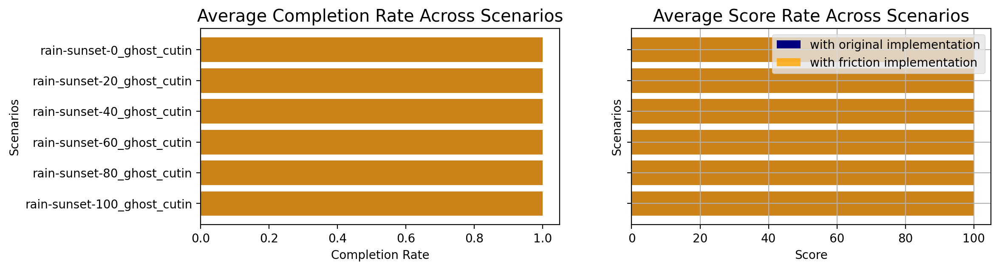

In [32]:
friction_legend = ["with original implementation", "with friction implementation"]

plt.subplots(1, 2, sharey=True, figsize=(12,3), dpi=200)
plt.gca().invert_yaxis()
width = 0.25

plt.subplot(1, 2, 1)
plt.style.use('ggplot')
plt.barh(subfolders, avg_complete_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_complete_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Completion Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Completion Rate')


plt.subplot(1, 2, 2)
plt.style.use('ggplot')
plt.barh(subfolders, avg_score_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_score_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Score Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Score')

plt.grid()

plt.legend()
plt.show()

## Comparison

In [33]:
attribute_order = ["x", "y", "v", "cvip", "steer", "brake", "throttle"]

all_medians = np.empty((len(txt_lists_fric), len(attribute_order), 2), dtype=object)
# [[[], []] * len(attribute_order)  for i in range(len(txt_lists_fric))]

all_medians

array([[[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]]], dtype=object)

In [34]:
full_legend = subfolders.copy()

### x,y traces

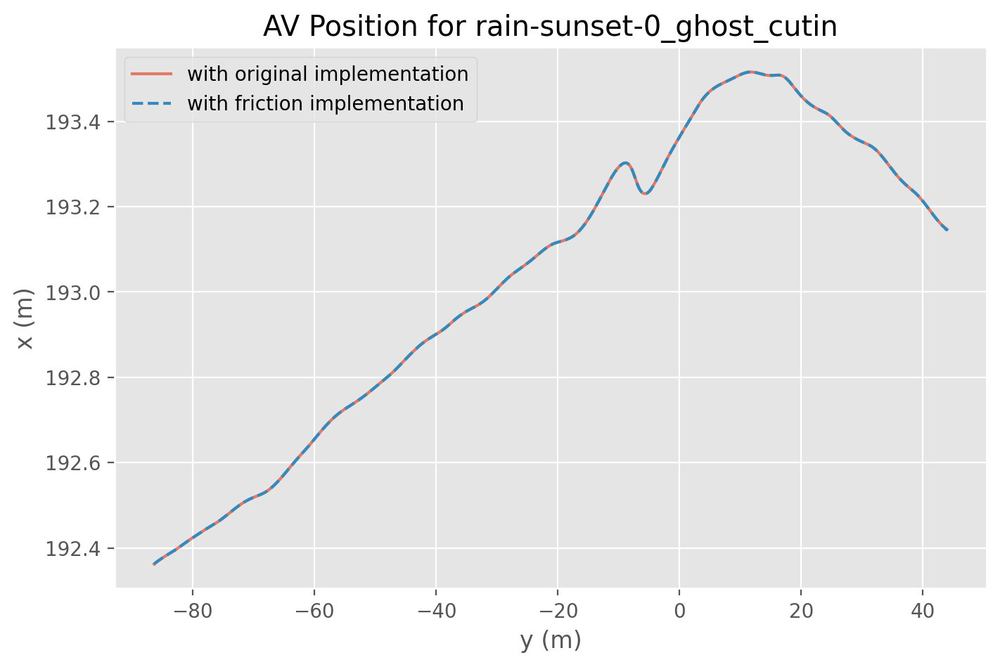

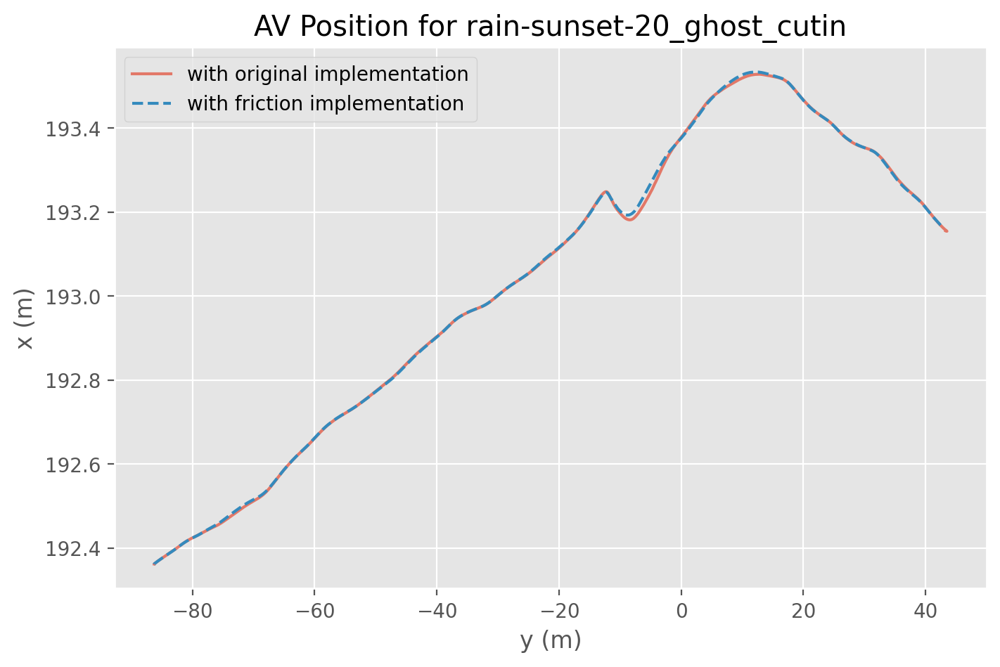

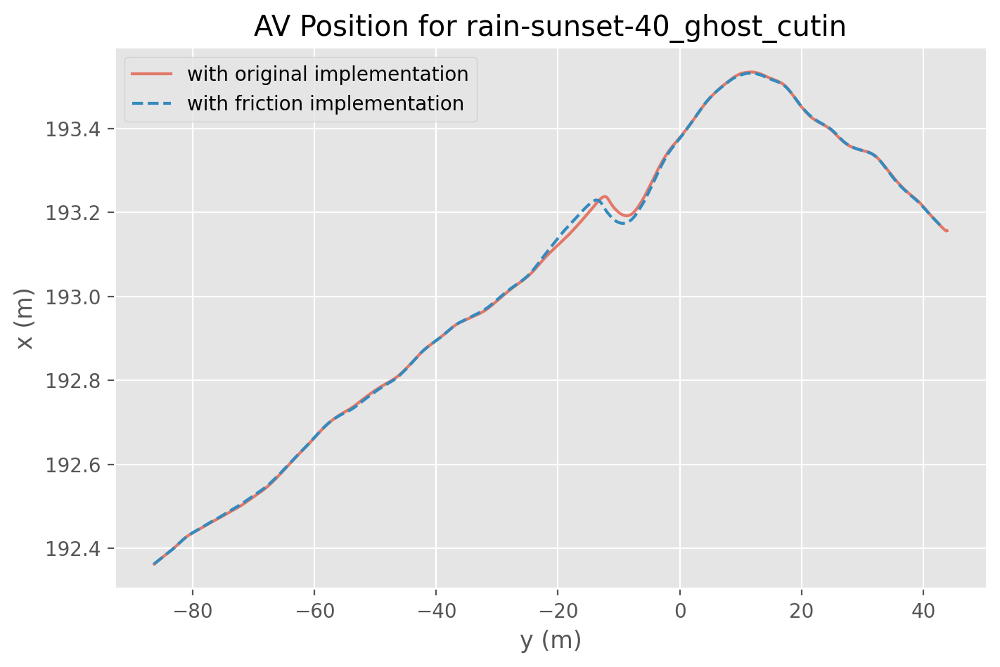

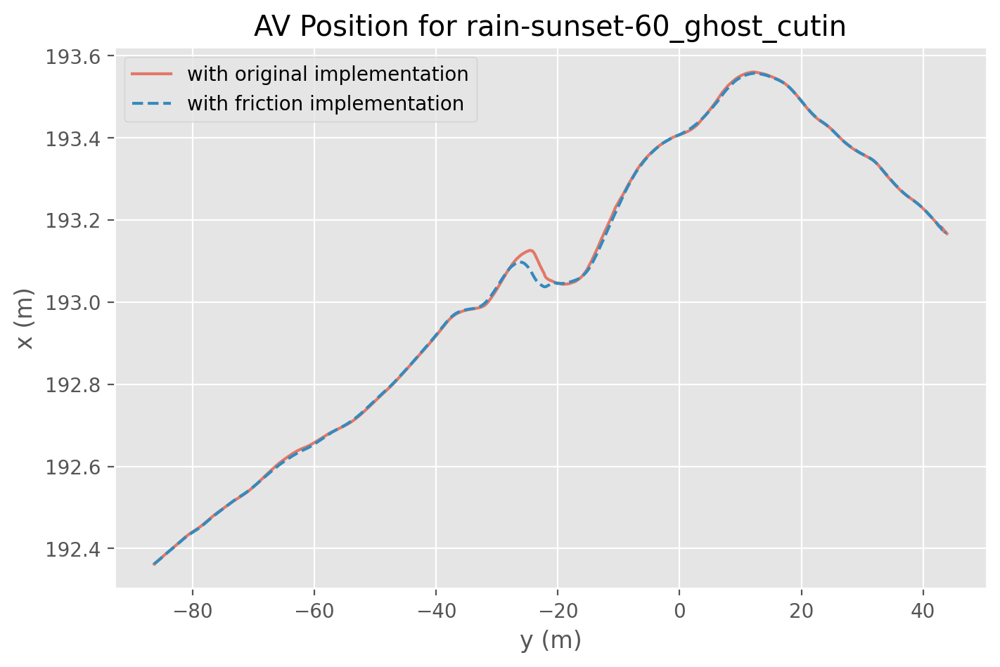

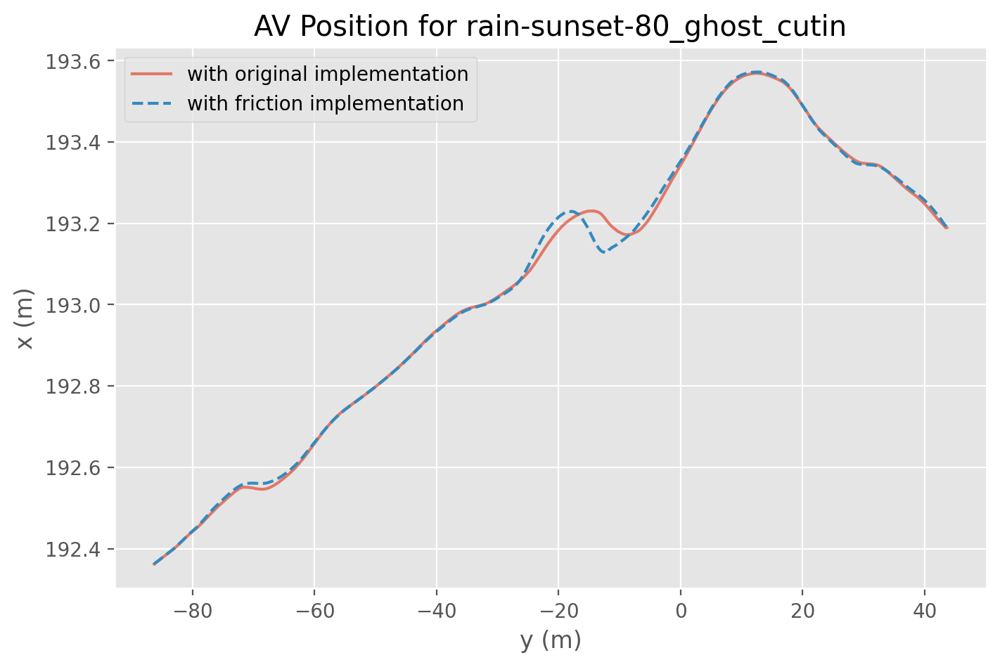

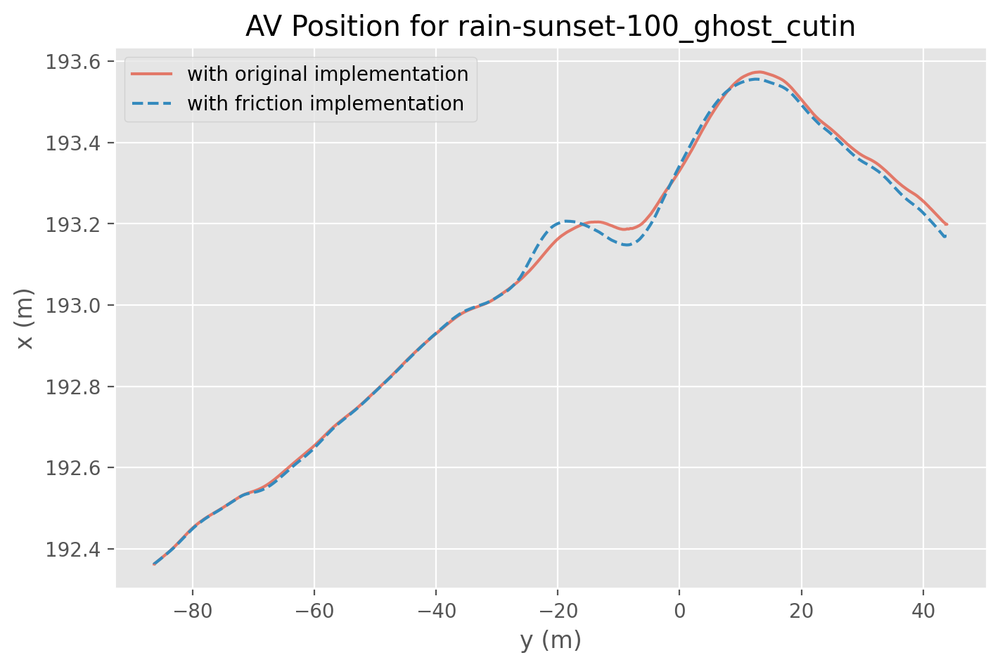

In [35]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)


    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    
    all_medians[weather][0][0] = median_orig_x
    all_medians[weather][0][1] = median_fric_x
    all_medians[weather][1][0] = median_orig_y
    all_medians[weather][1][1] = median_fric_y
    
    plt.plot(median_fric_y, median_fric_x, '--')
    plt.xlabel("y (m)")
    plt.ylabel("x (m)")
    
    plt.title("AV Position for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

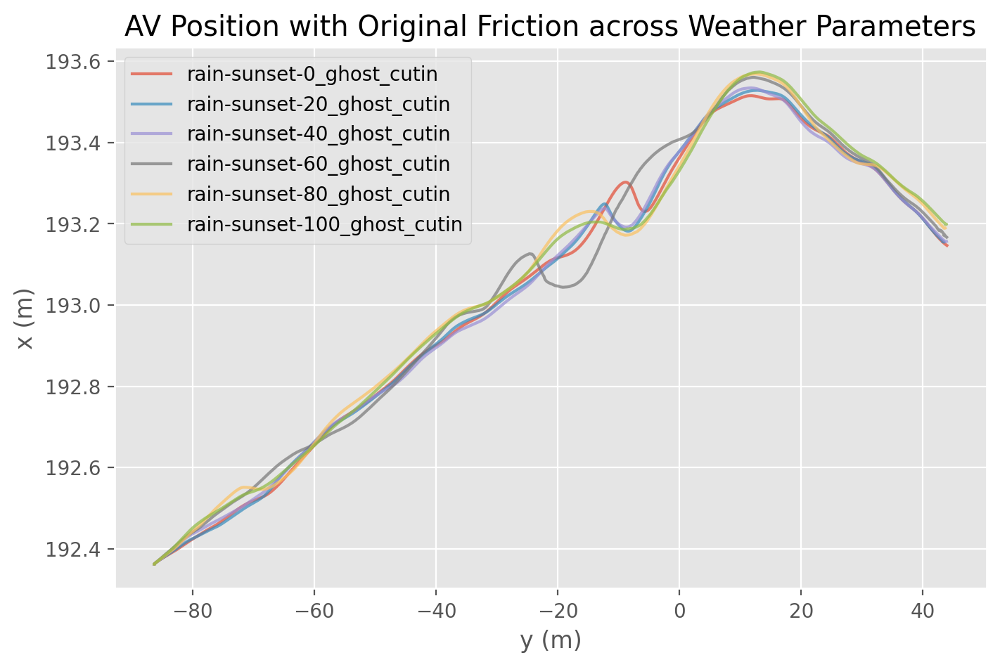

In [36]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)

    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

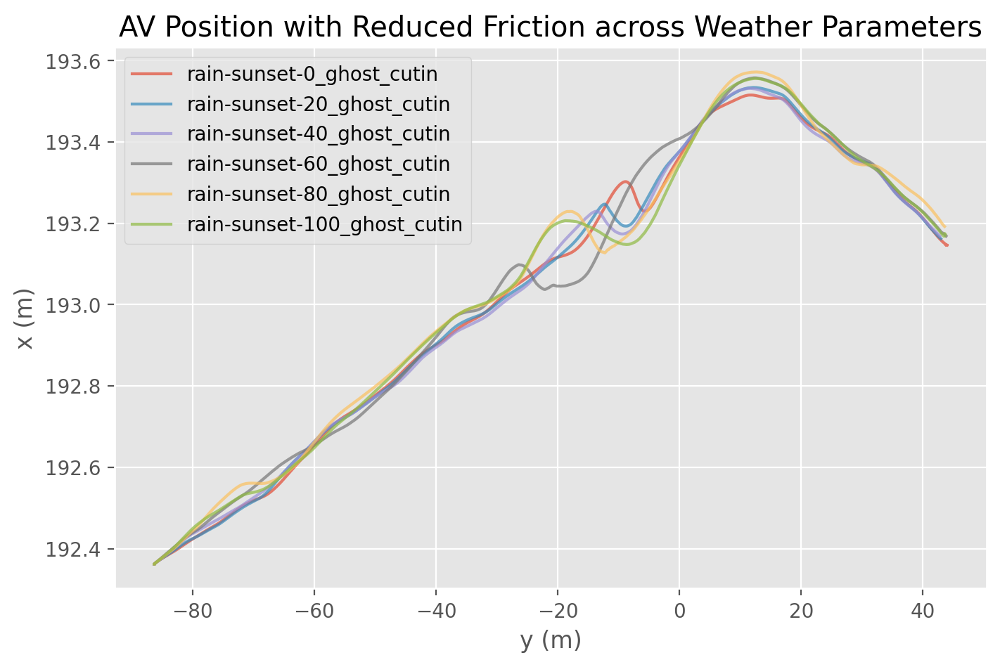

In [37]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    plt.plot(median_fric_y, median_fric_x, alpha=0.7)
    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### v

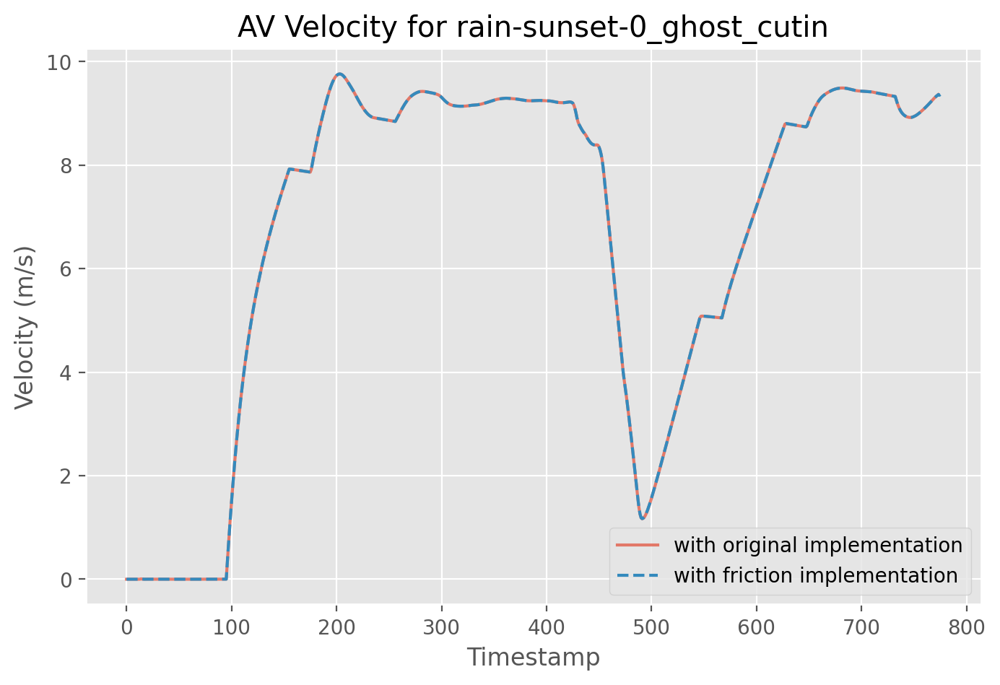

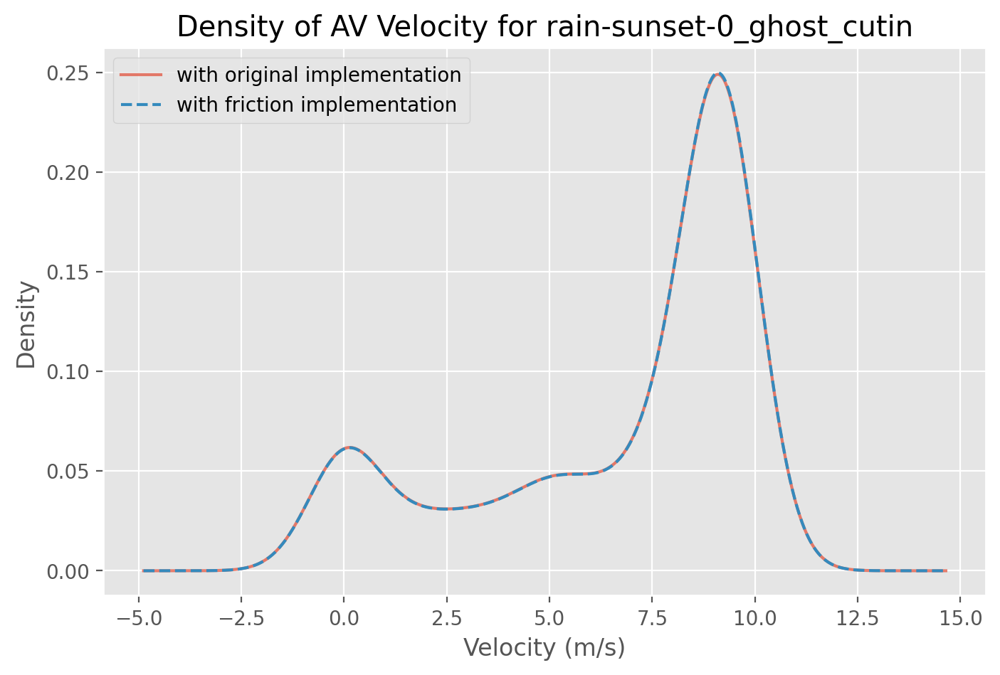

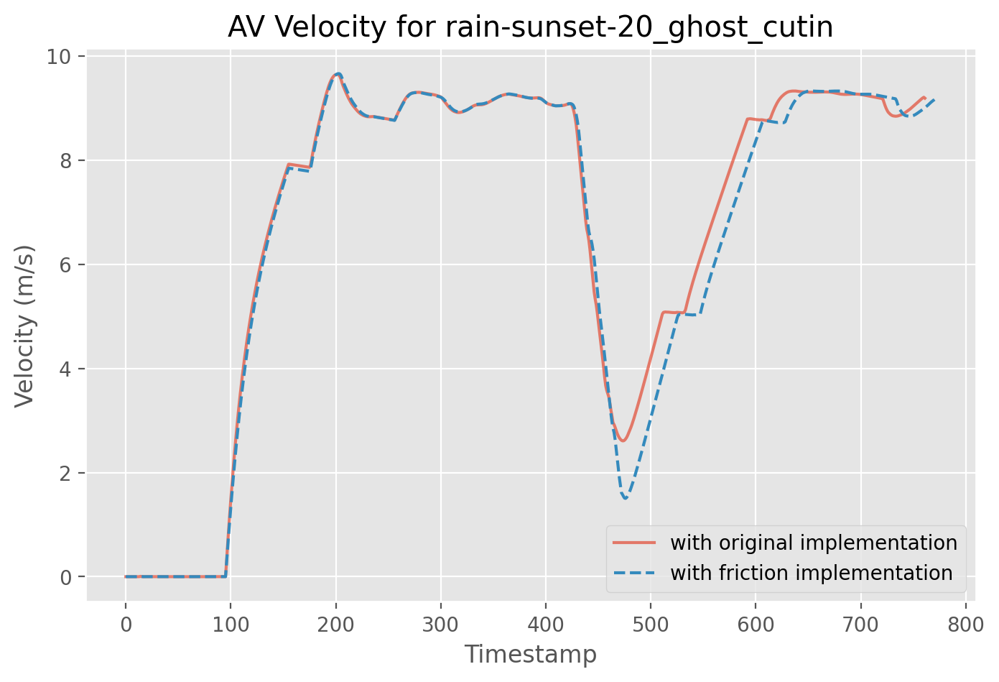

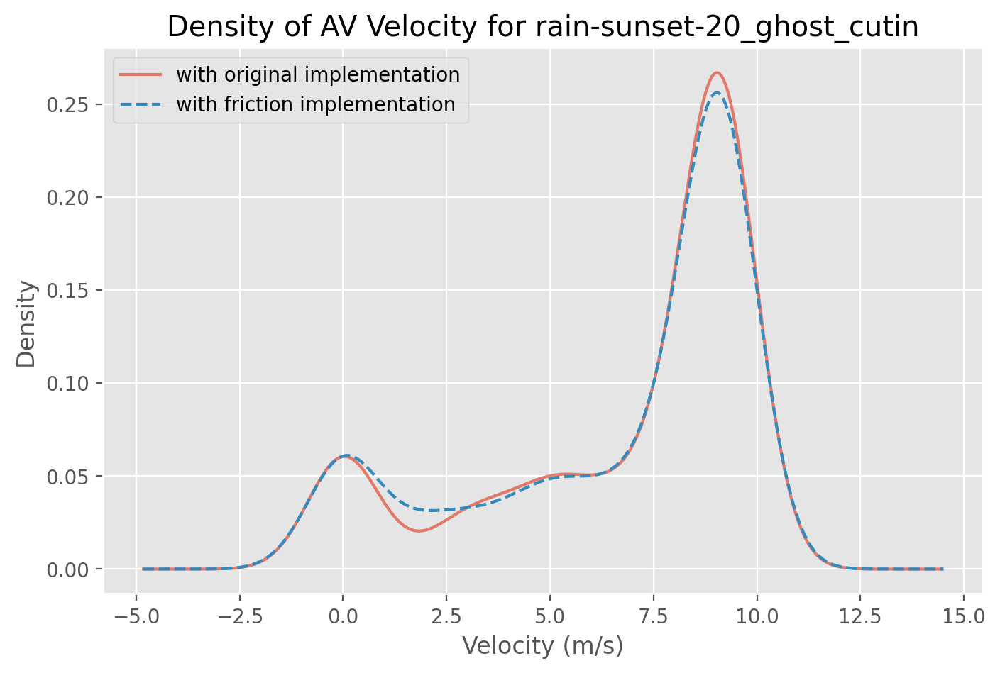

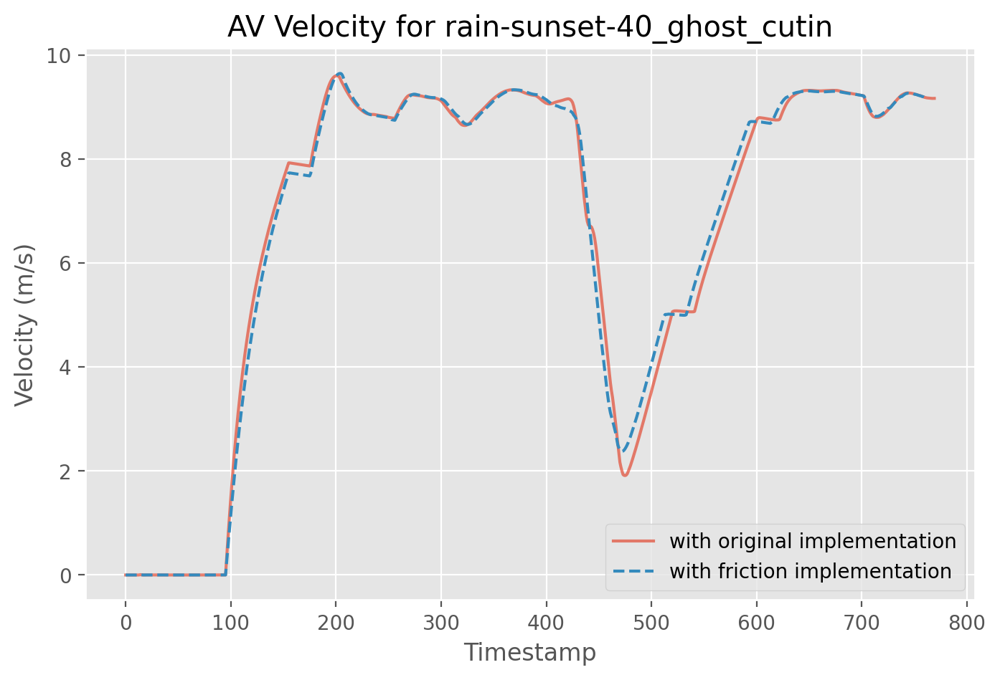

...

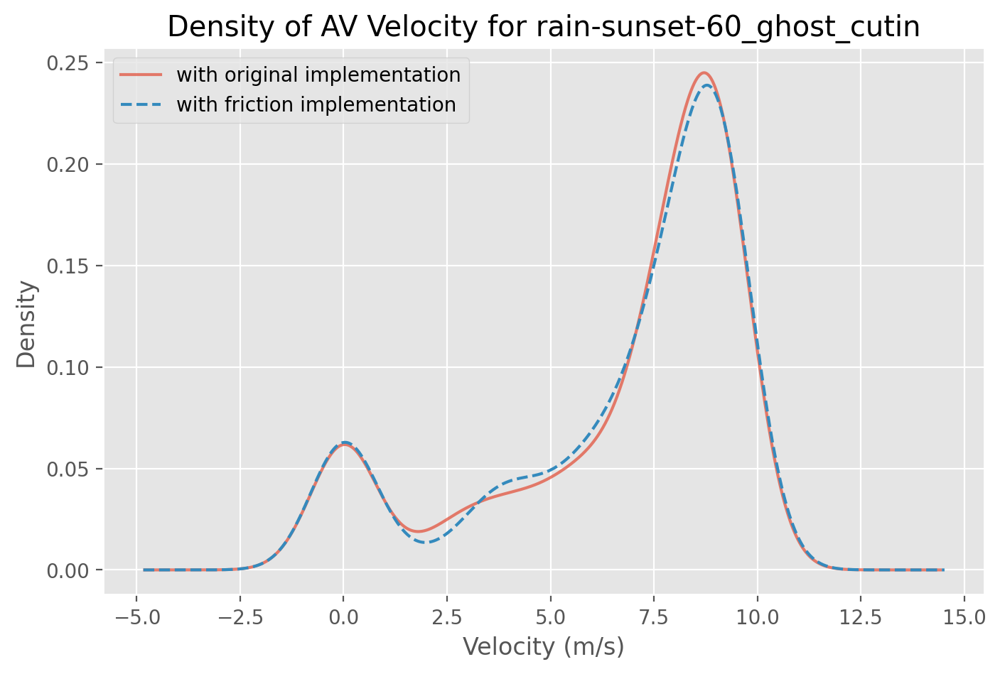

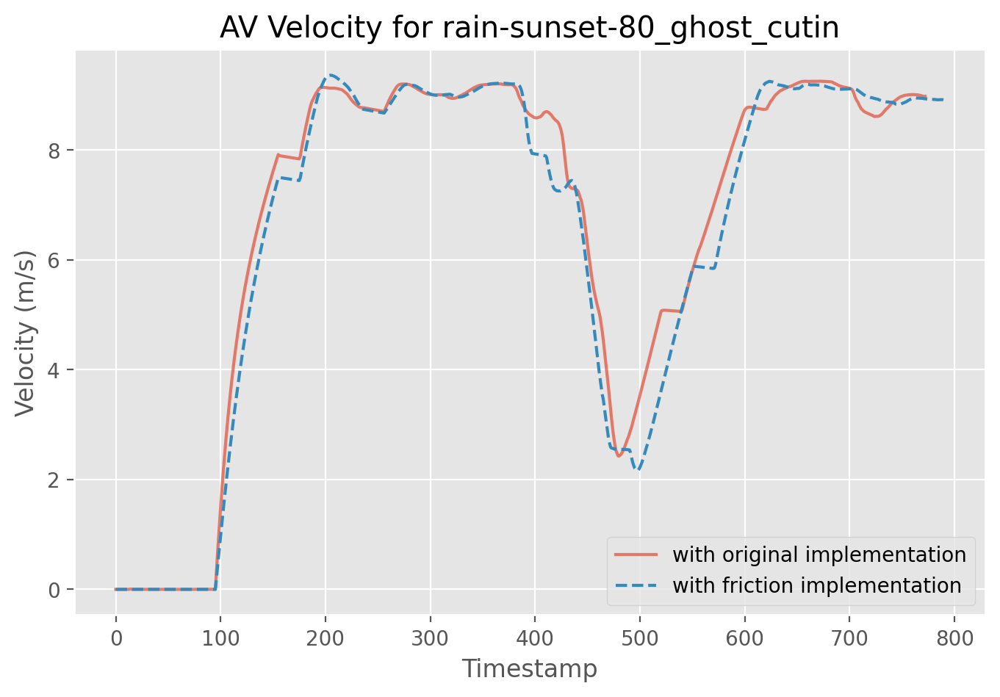

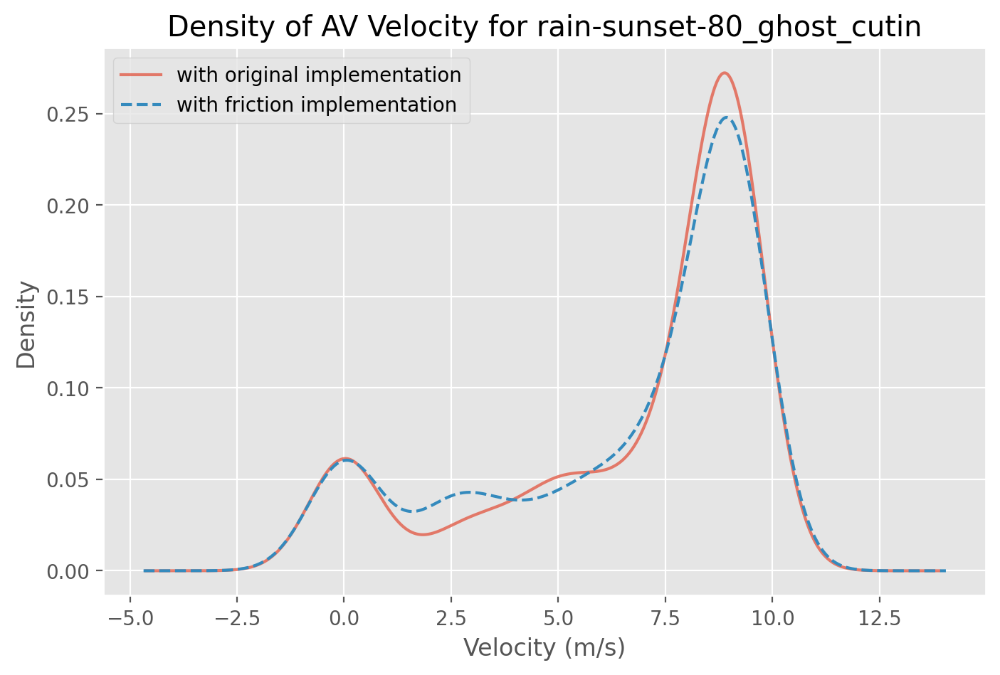

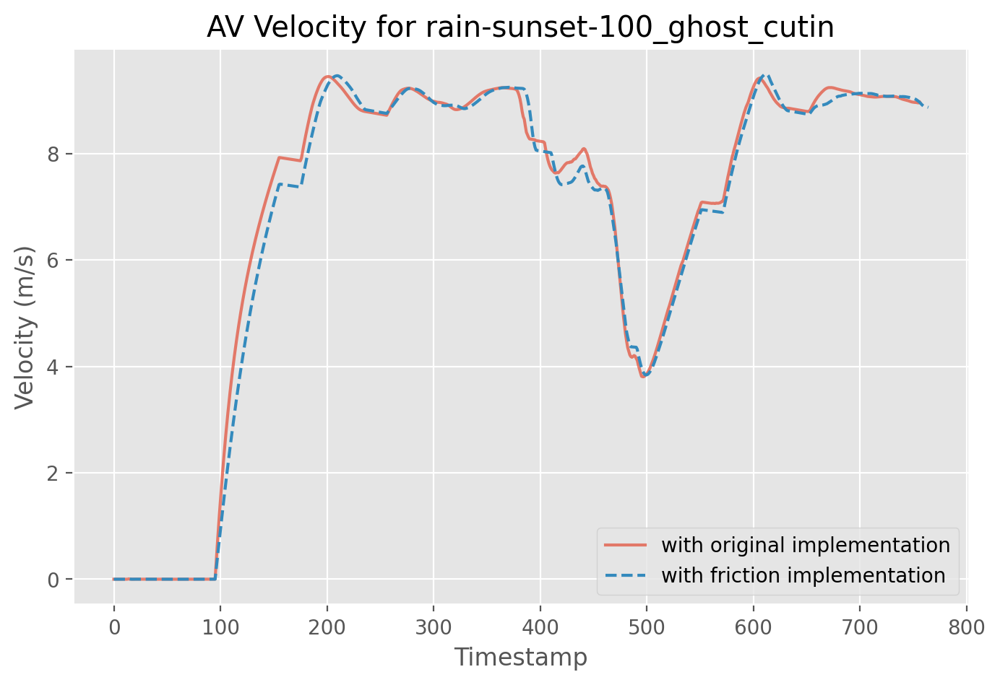

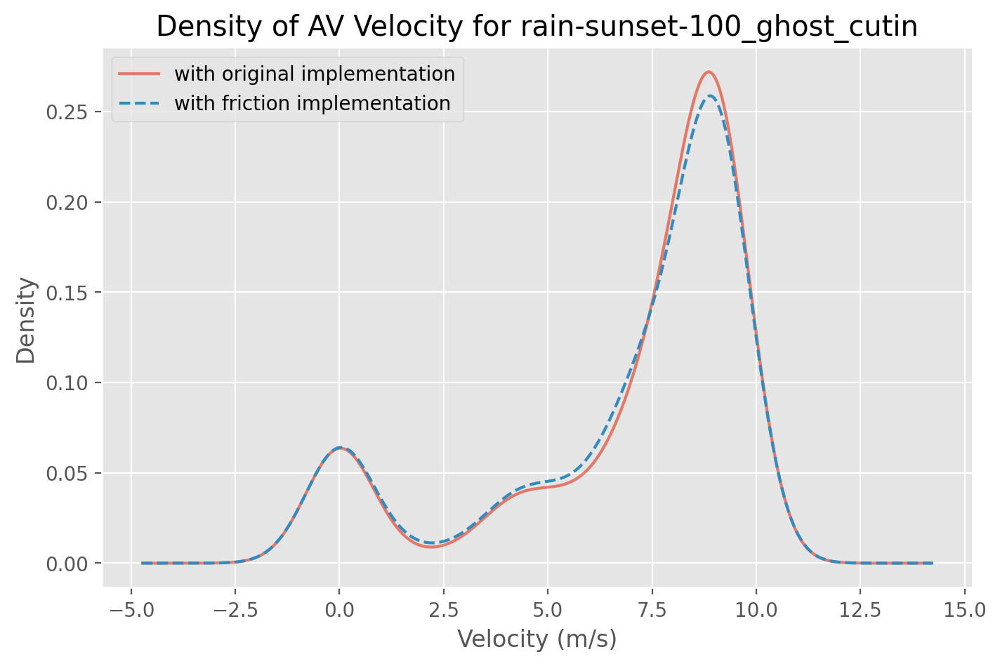

In [38]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)

    plt.plot(median_orig_v, alpha=0.7)


    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any():
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)
    
    all_medians[weather][2][0] = median_orig_v
    all_medians[weather][2][1] = median_fric_v
    
    plt.plot(median_fric_v, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Velocity (m/s)")
    plt.title("AV Velocity for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Velocity (m/s)")
    plt.ylabel("Density")
    median_orig_v.plot.density(alpha=0.7)
    median_fric_v.plot.density(style='--')
    plt.title("Density of AV Velocity for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

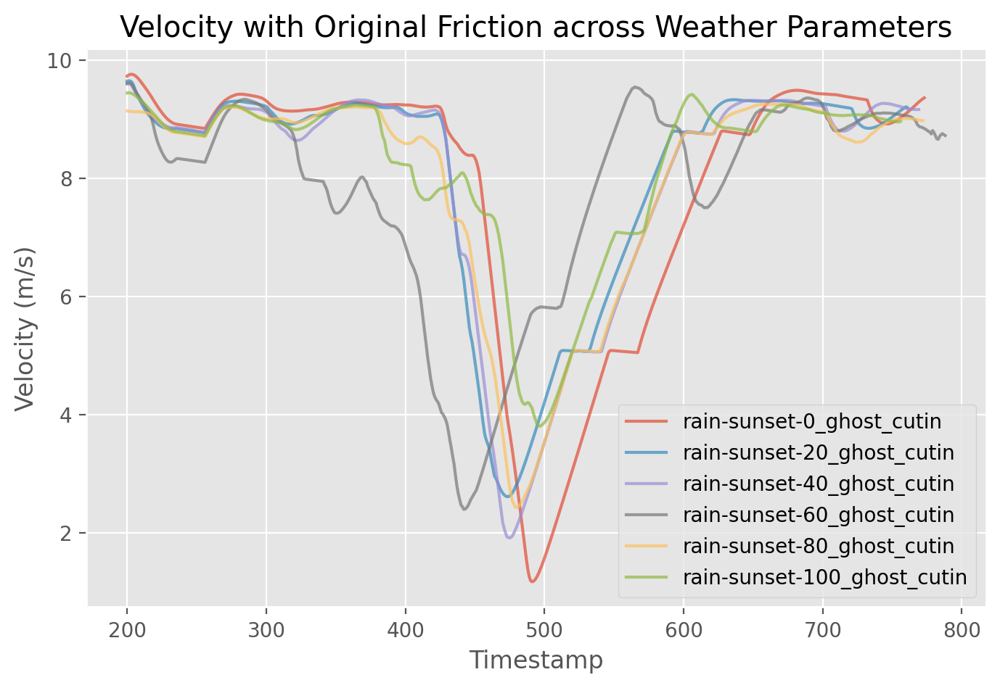

In [39]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'v'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)


    plt.plot(median_orig_v[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

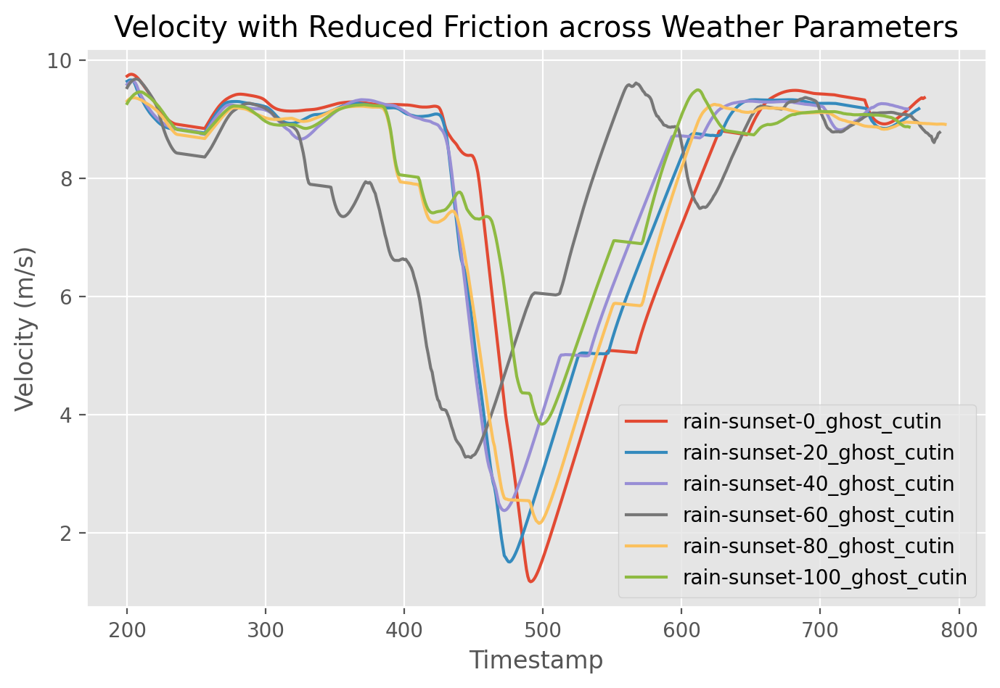

In [40]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any() :
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)

    plt.plot(median_fric_v[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### cvip

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
771     52.339274
772     52.437197
773     52.534660
774     53.079631
775     53.205316
Length: 776, dtype: float64


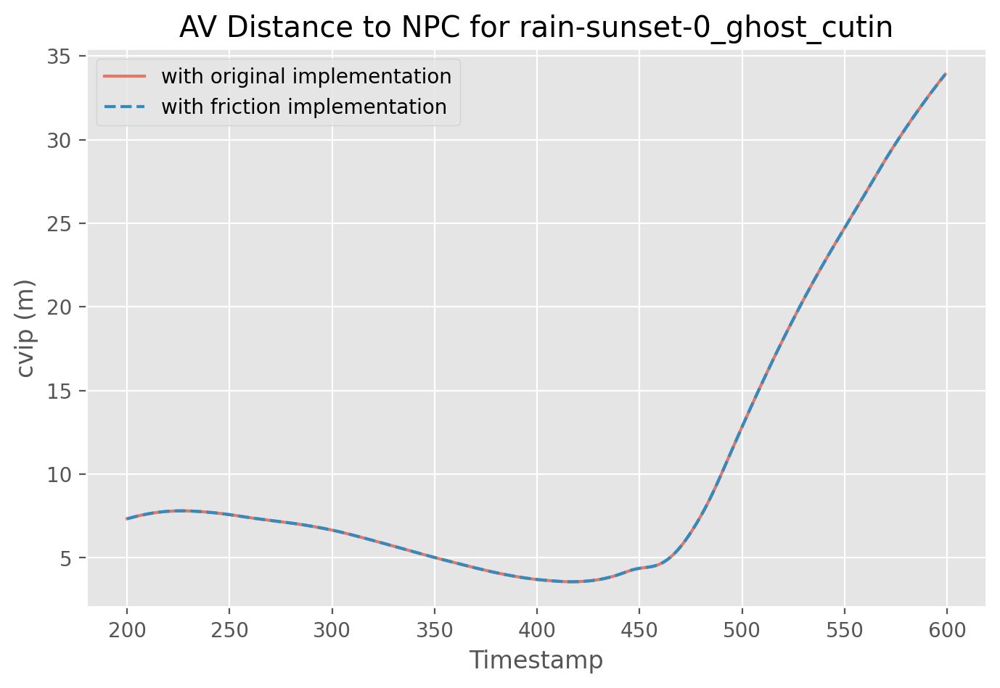

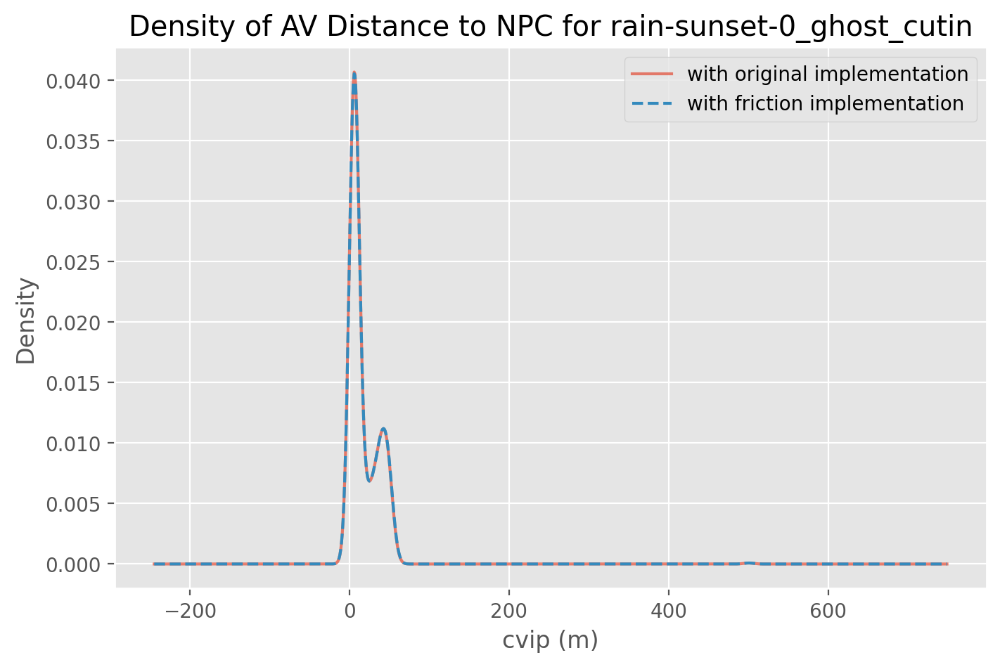

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
767     52.040368
768     52.171054
769     52.304308
770     52.501299
771     52.631457
Length: 772, dtype: float64


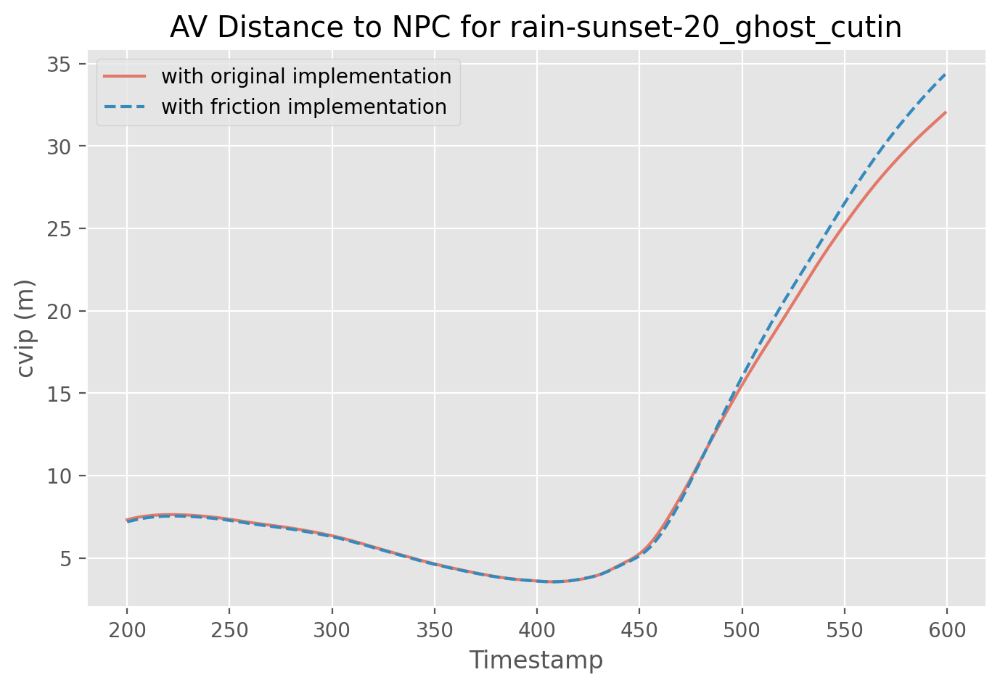

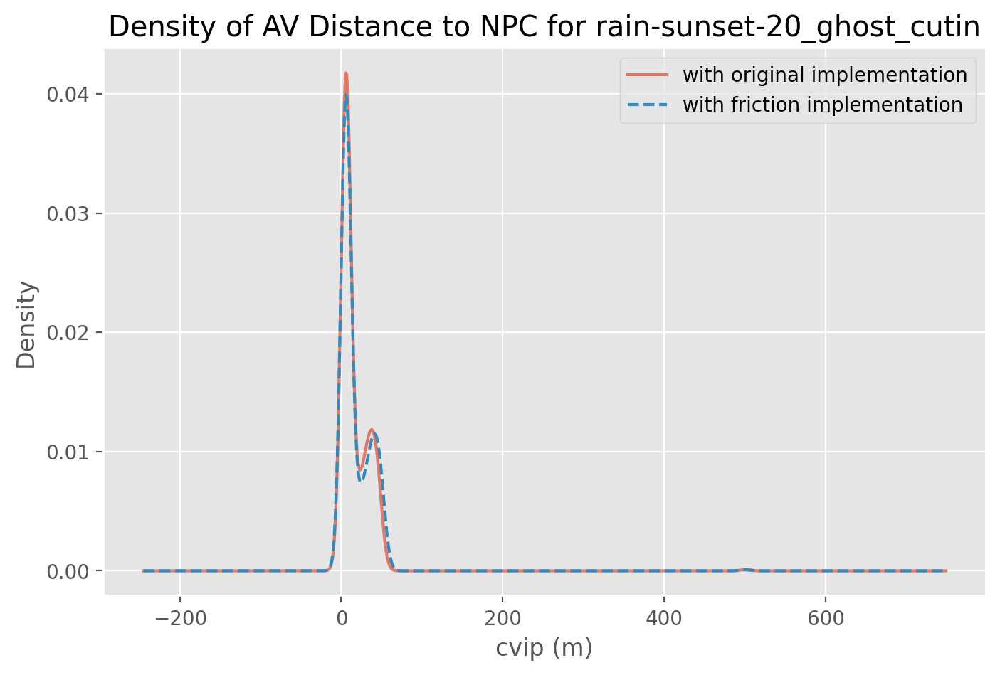

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
759     49.042439
760     49.173767
761     49.309259
762     49.424934
763     49.540572
Length: 764, dtype: float64


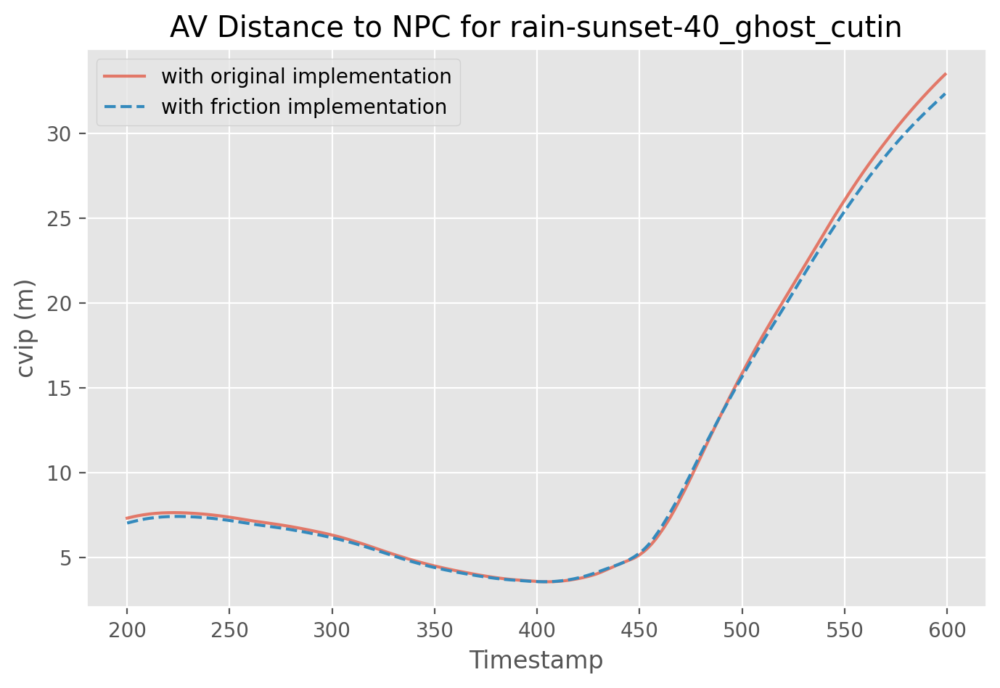

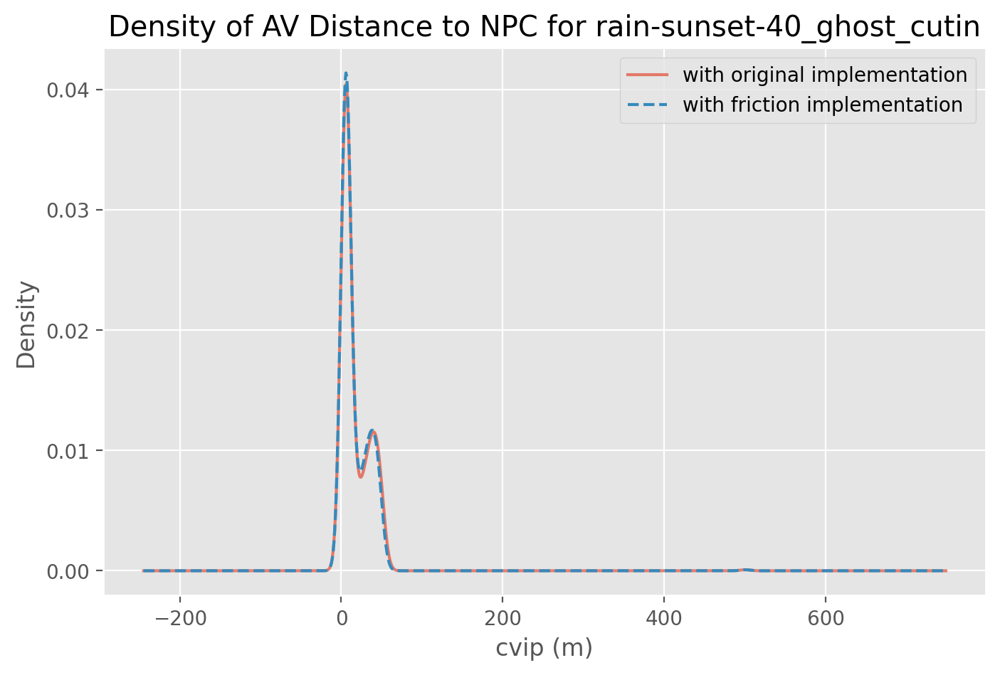

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
782     55.087089
783     55.371130
784     55.612430
785     56.037511
786     56.184233
Length: 787, dtype: float64


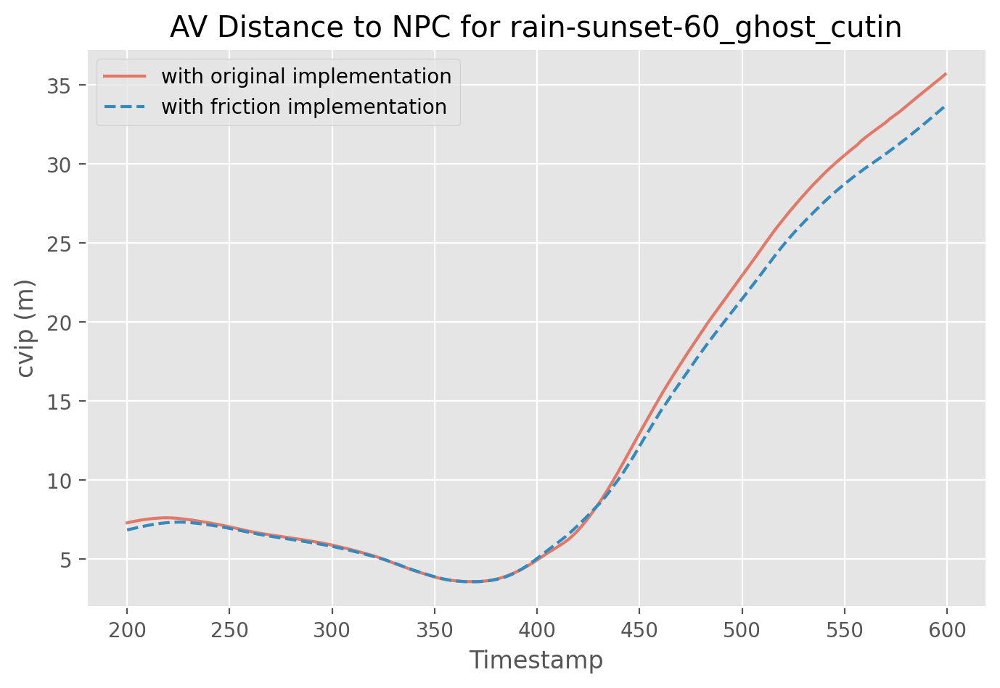

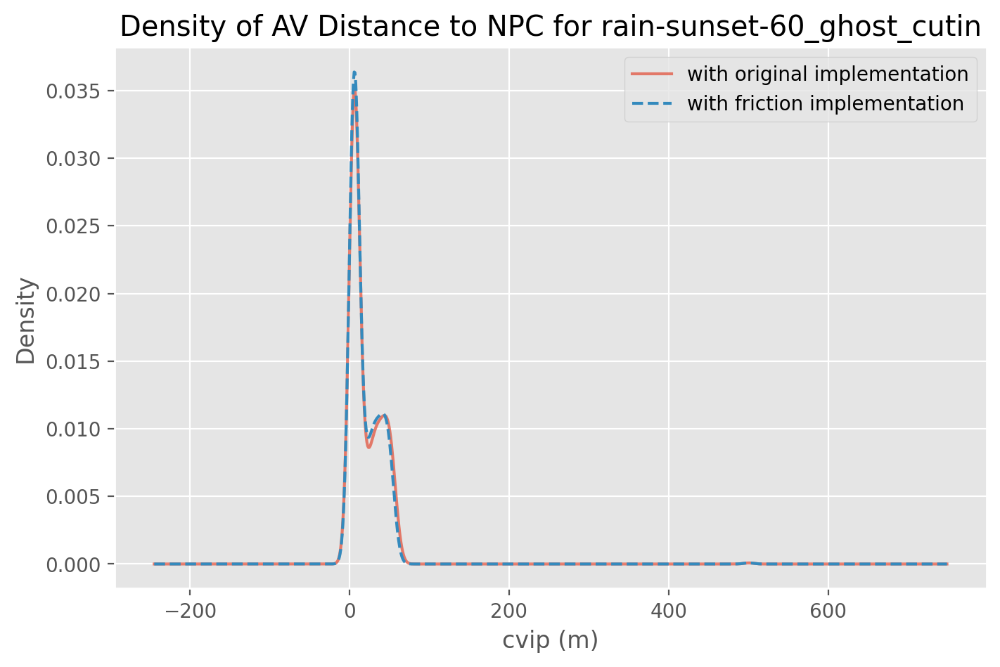

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
786     54.396482
787     54.522182
788     54.666710
789     54.842597
790     54.956212
Length: 791, dtype: float64


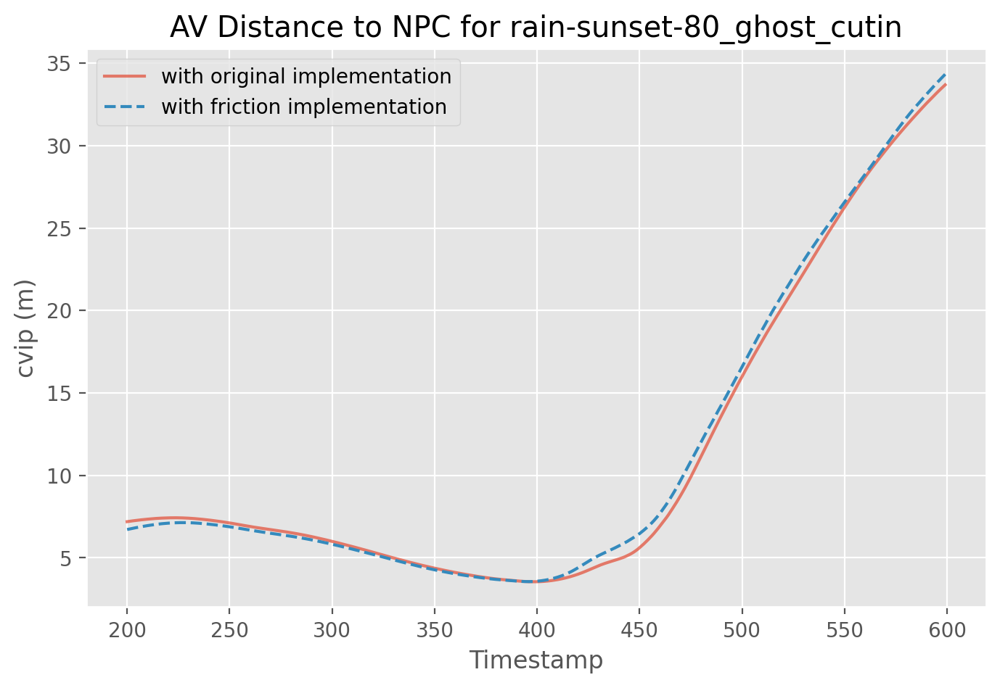

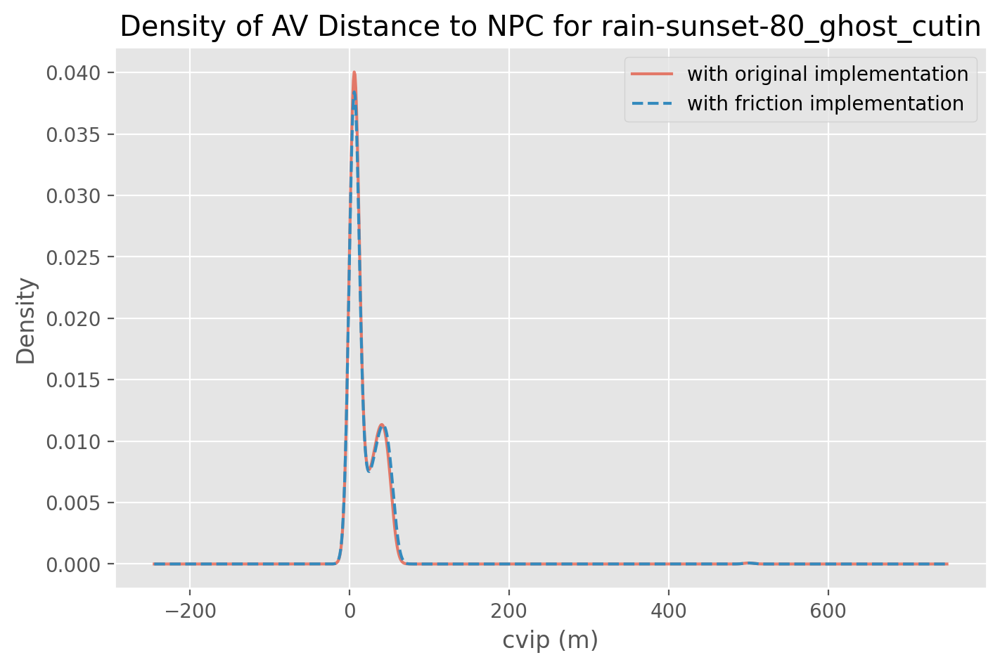

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
760     22.455094
761     22.524229
762     22.636413
763     22.876583
764     23.129910
Length: 765, dtype: float64


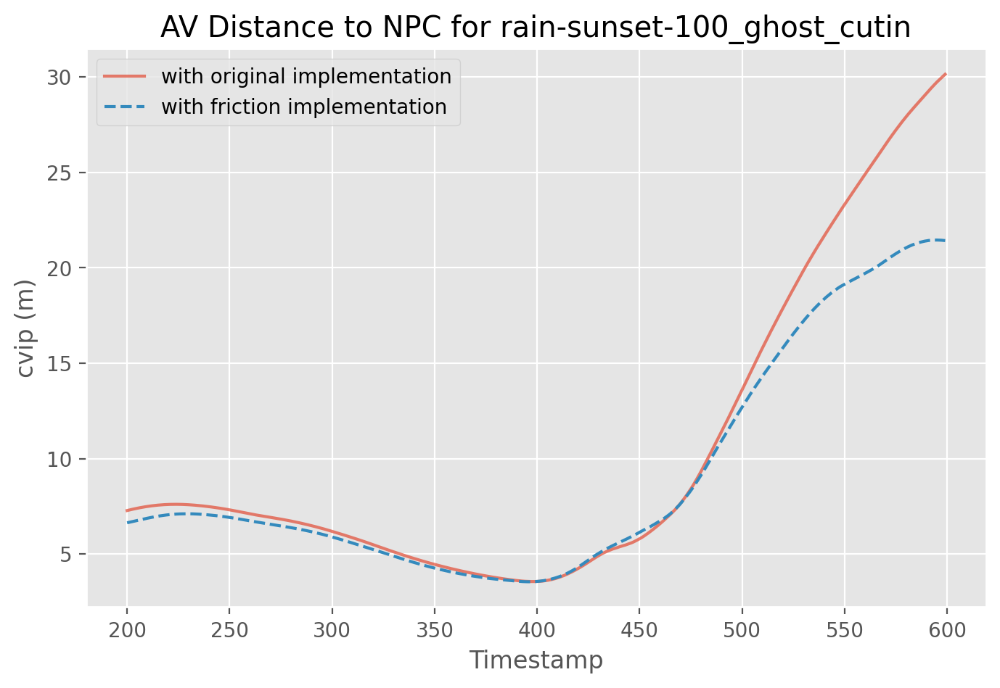

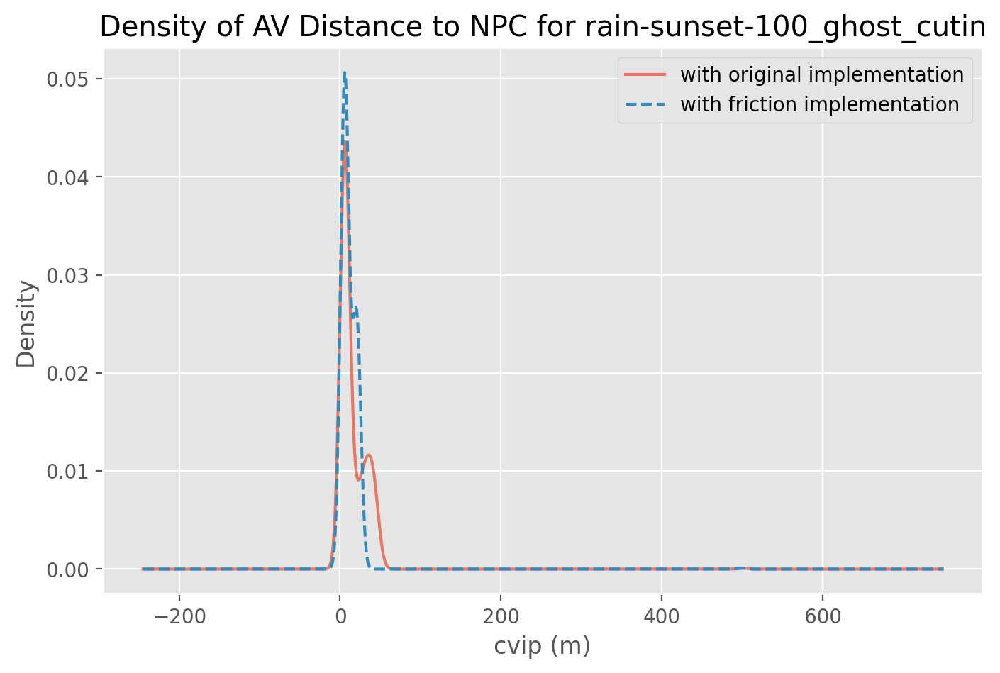

In [41]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)

    plt.plot(median_orig_cvip.iloc[200:600], alpha=0.7)


    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any():
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)
    
    print(median_fric_cvip)
    
    all_medians[weather][3][0] = median_orig_cvip
    all_medians[weather][3][1] = median_fric_cvip
    
    plt.plot(median_fric_cvip.iloc[200:600], '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("cvip (m)")
    plt.title("AV Distance to NPC for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("cvip (m)")
    plt.ylabel("Density")
    median_orig_cvip.plot.density(alpha=0.7)
    median_fric_cvip.plot.density(style='--')
    plt.title("Density of AV Distance to NPC for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

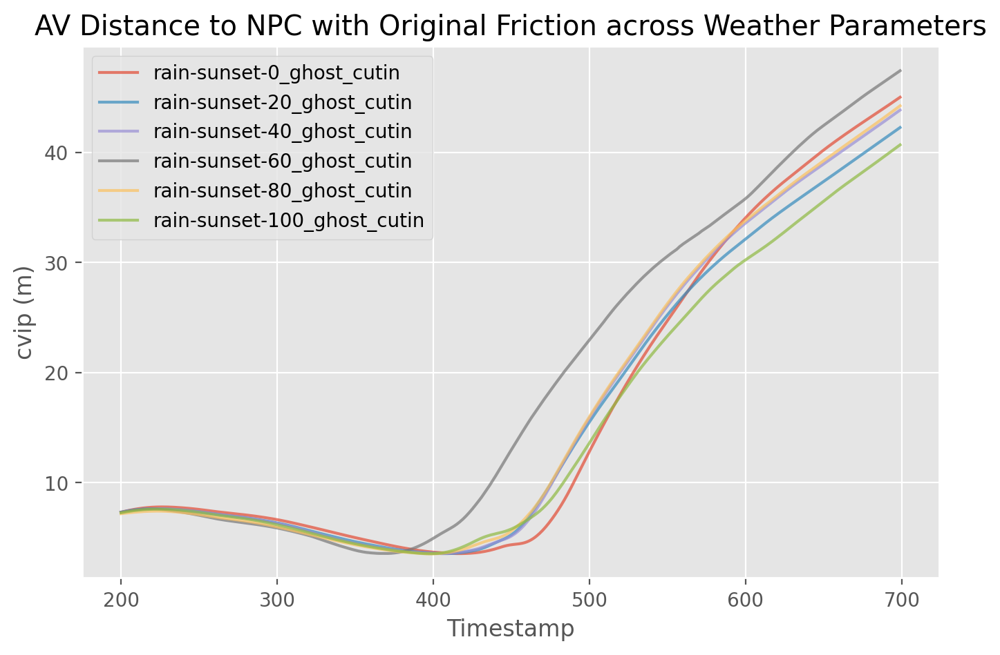

In [42]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)


    plt.plot(median_orig_cvip[200:700], alpha=0.7)



    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

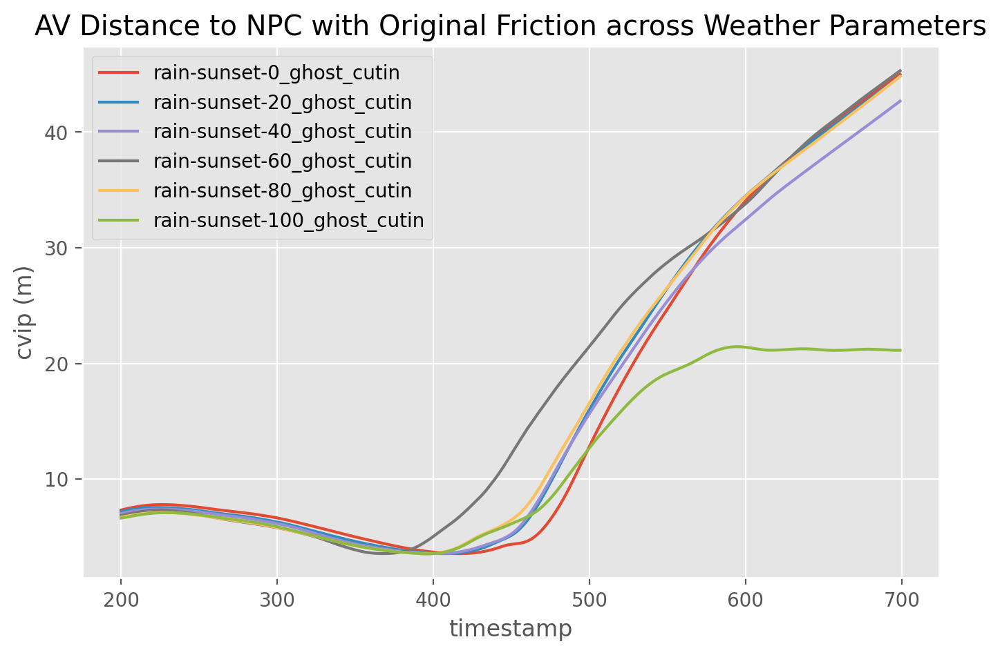

In [43]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any() :
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)

    plt.plot(median_fric_cvip[200:700])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### steer

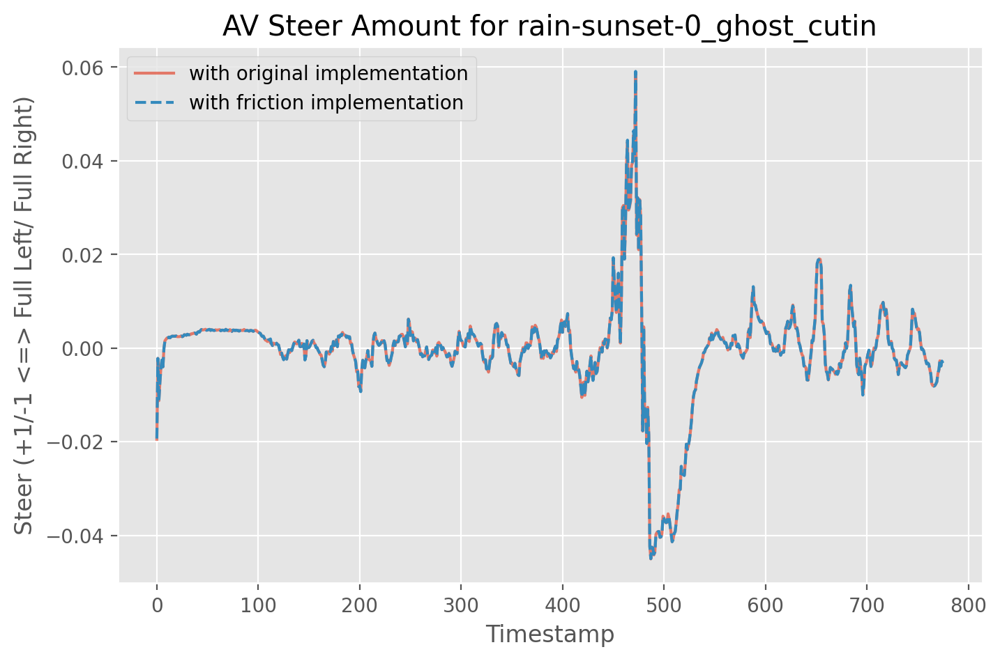

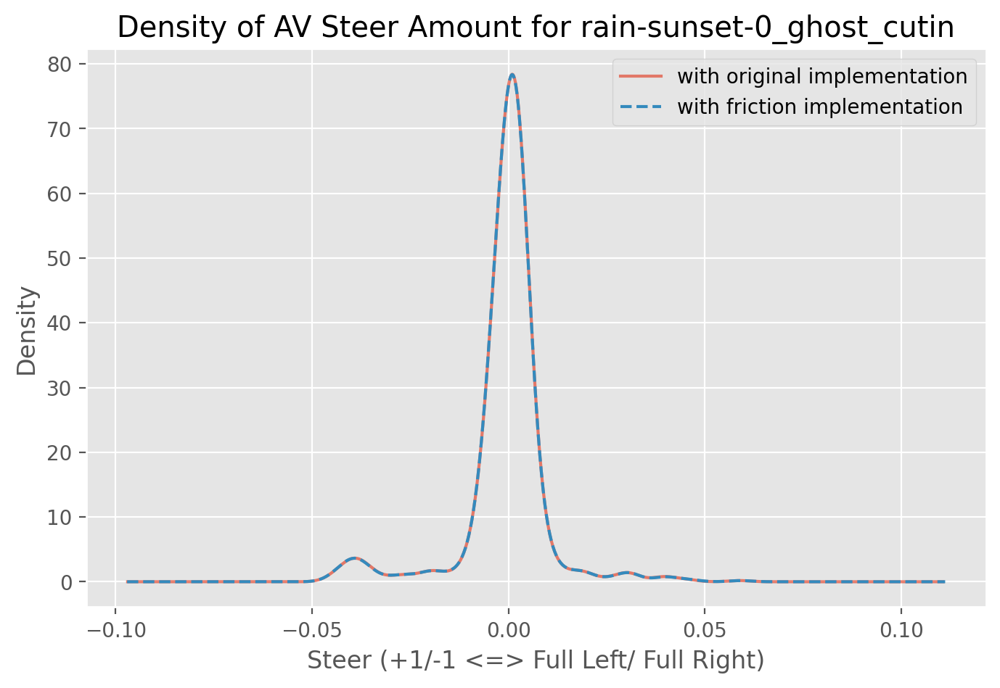

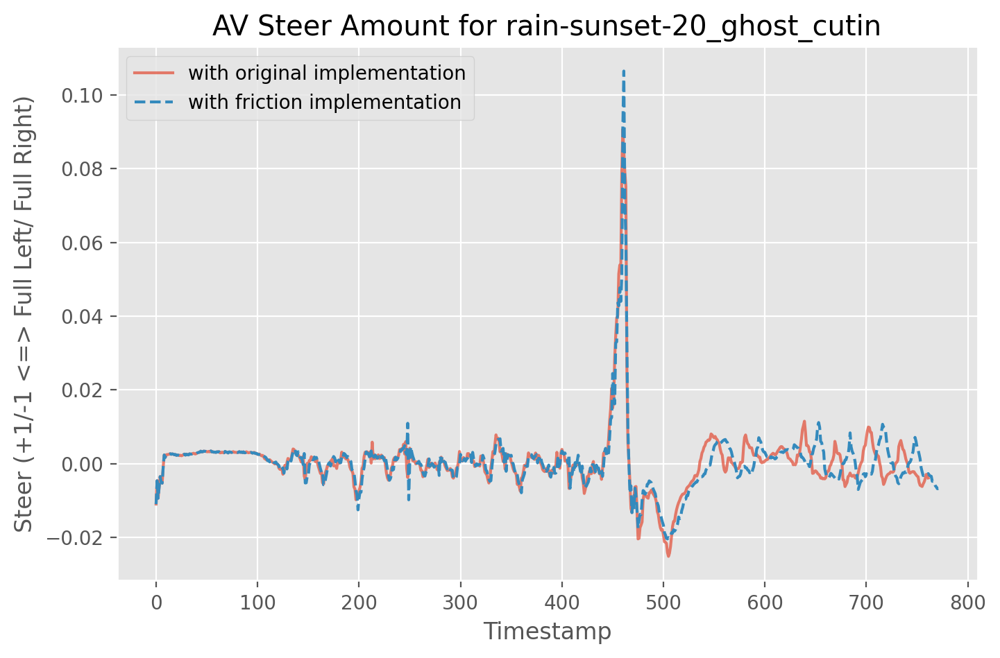

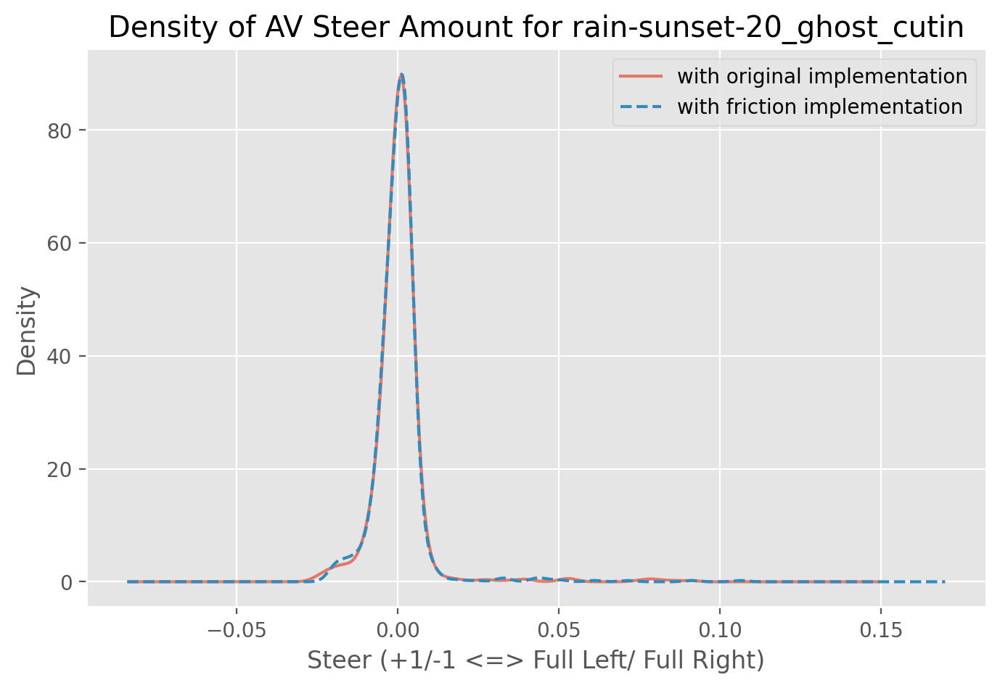

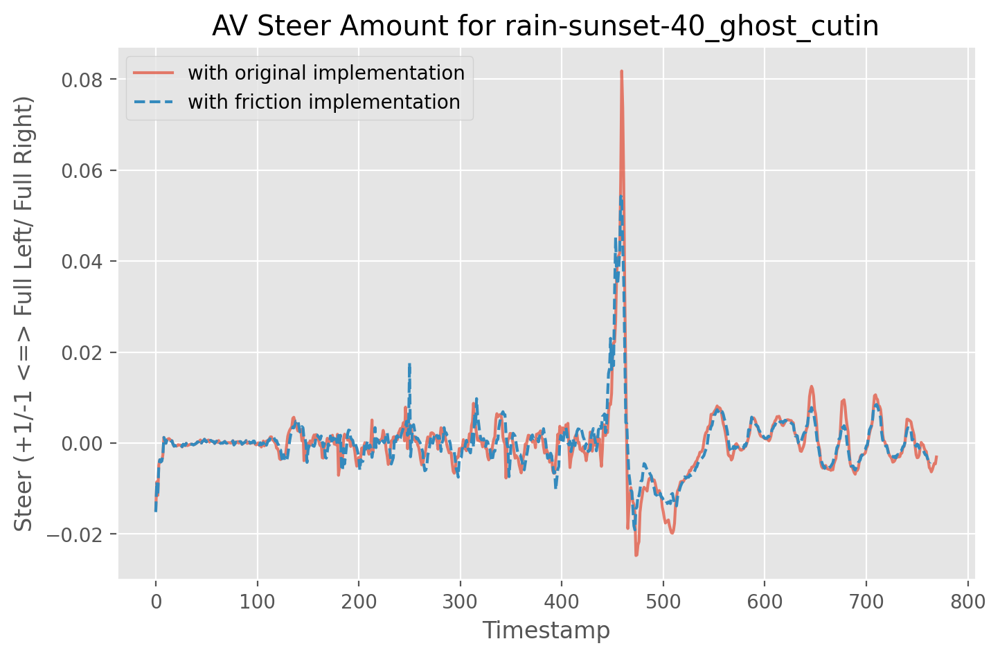

...

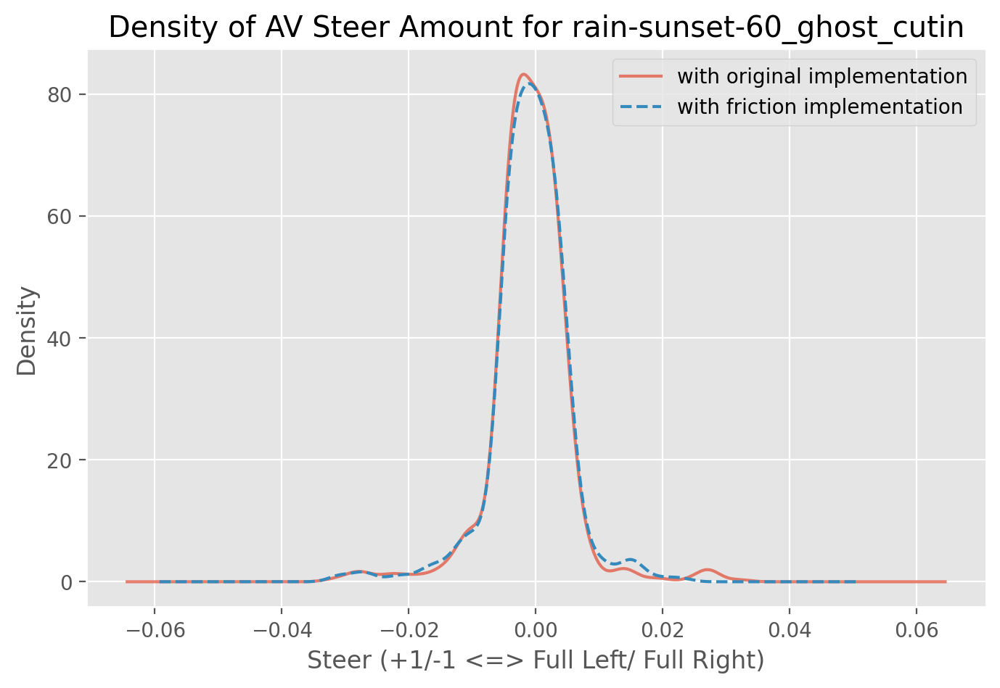

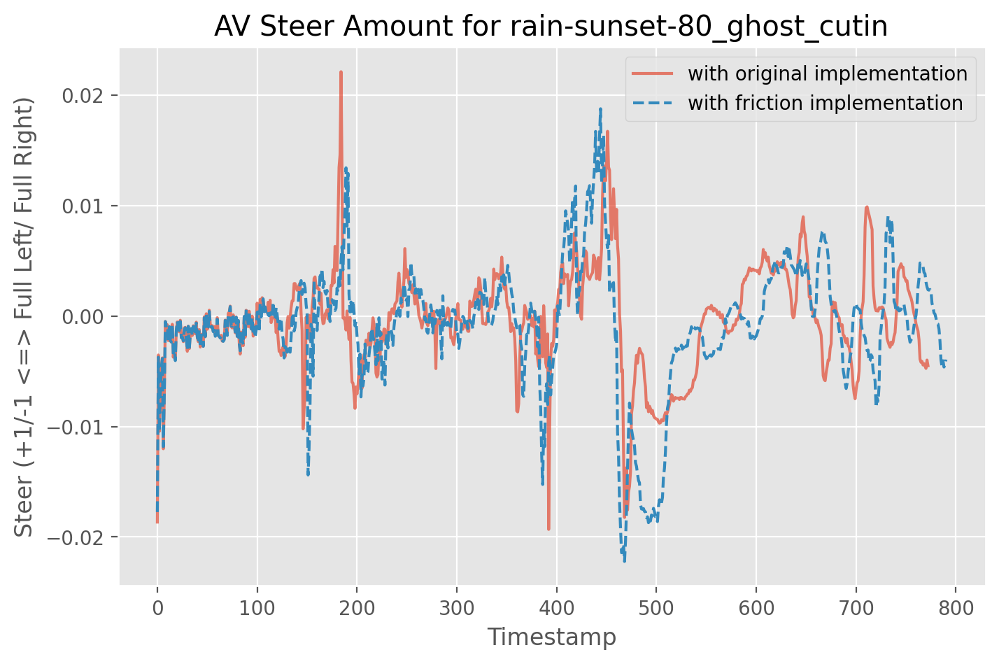

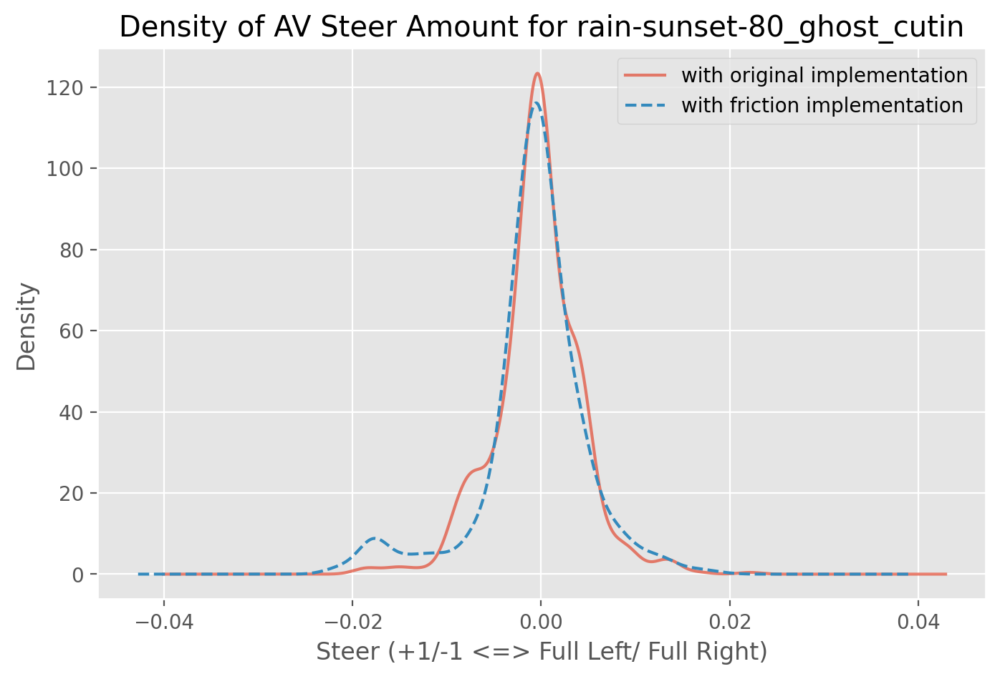

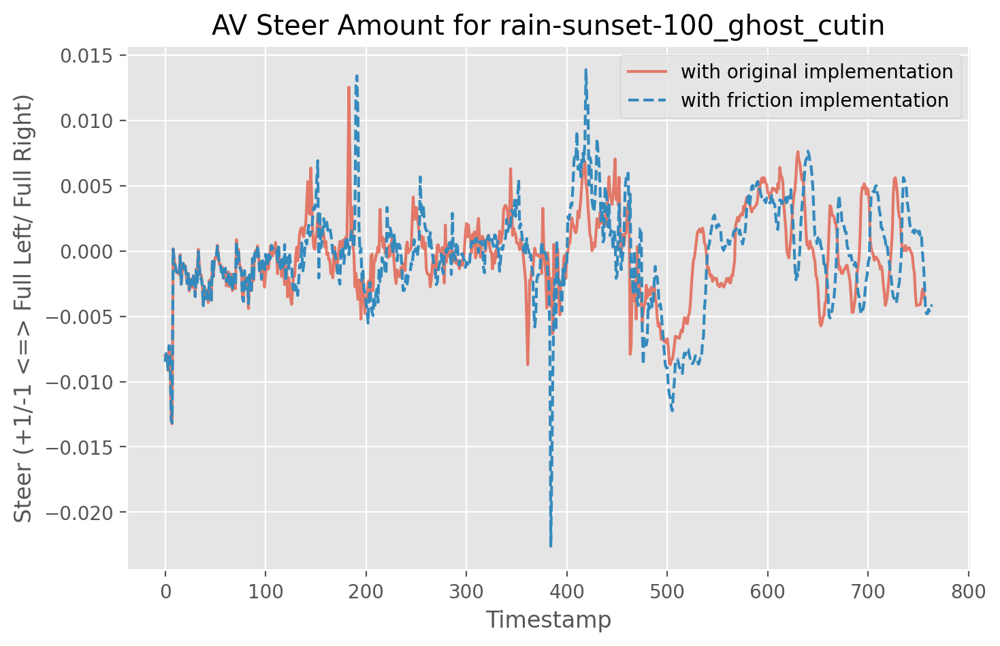

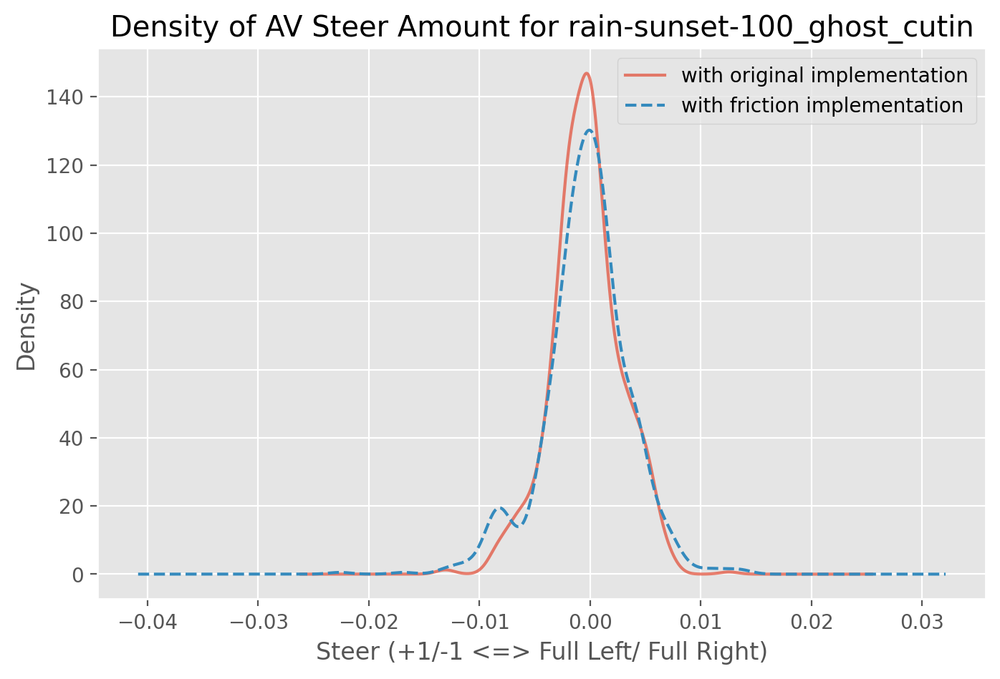

In [44]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)

    plt.plot(median_orig_steer, alpha=0.7)


    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any():
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)
    
    all_medians[weather][4][0] = median_orig_steer
    all_medians[weather][4][1] = median_fric_steer
    
    plt.plot(median_fric_steer, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
    plt.title("AV Steer Amount for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Steer (+1/-1 <=> Full Left/ Full Right)")
    plt.ylabel("Density")
    median_orig_steer.plot.density(alpha=0.7)
    median_fric_steer.plot.density(style='--')
    plt.title("Density of AV Steer Amount for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

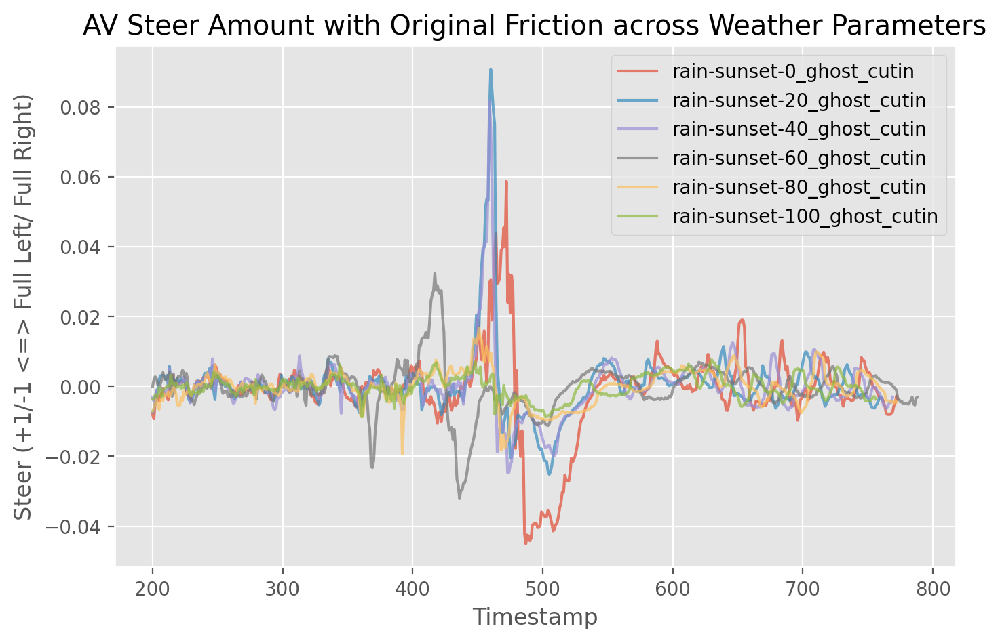

In [45]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'steer'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)


    plt.plot(median_orig_steer[200:], alpha=0.7)

plt.xlabel("Timestamp")
plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
plt.title("AV Steer Amount with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

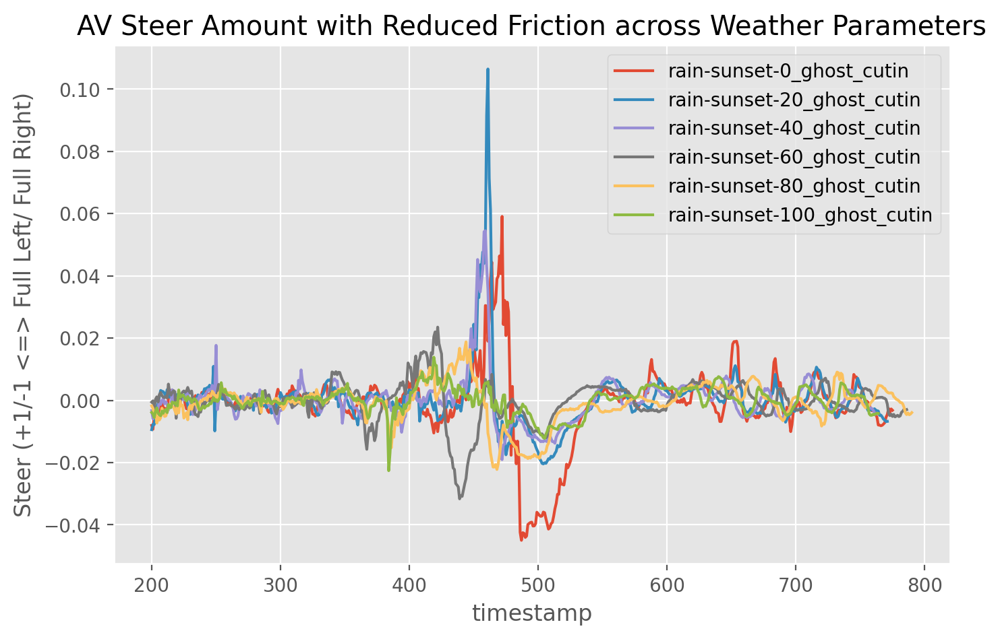

In [46]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any() :
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)

    plt.plot(median_fric_steer[200:])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
plt.title("AV Steer Amount with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### brake

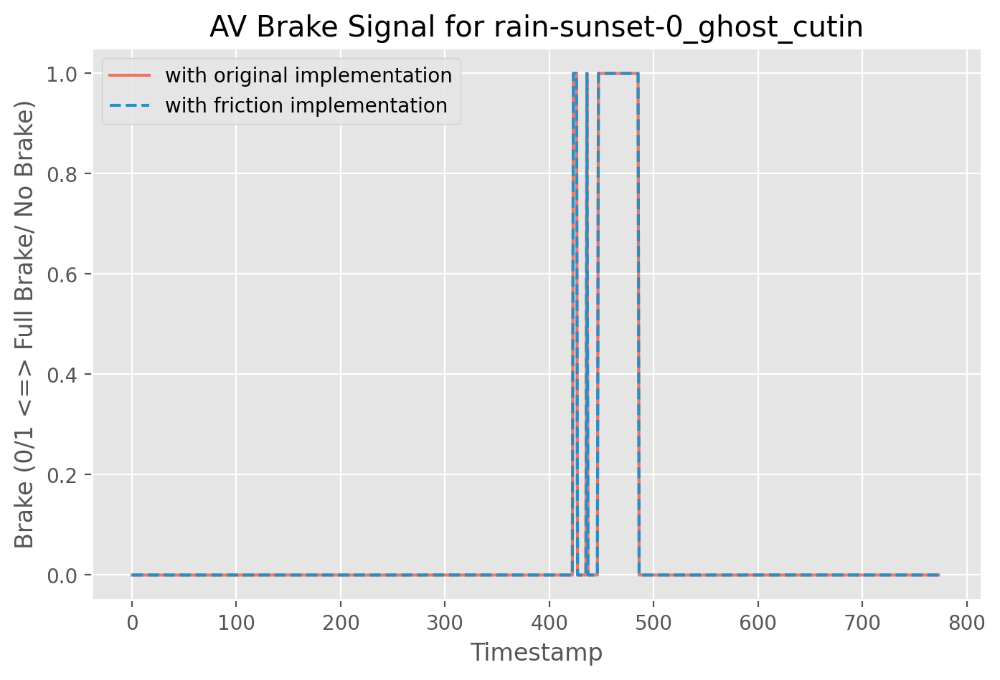

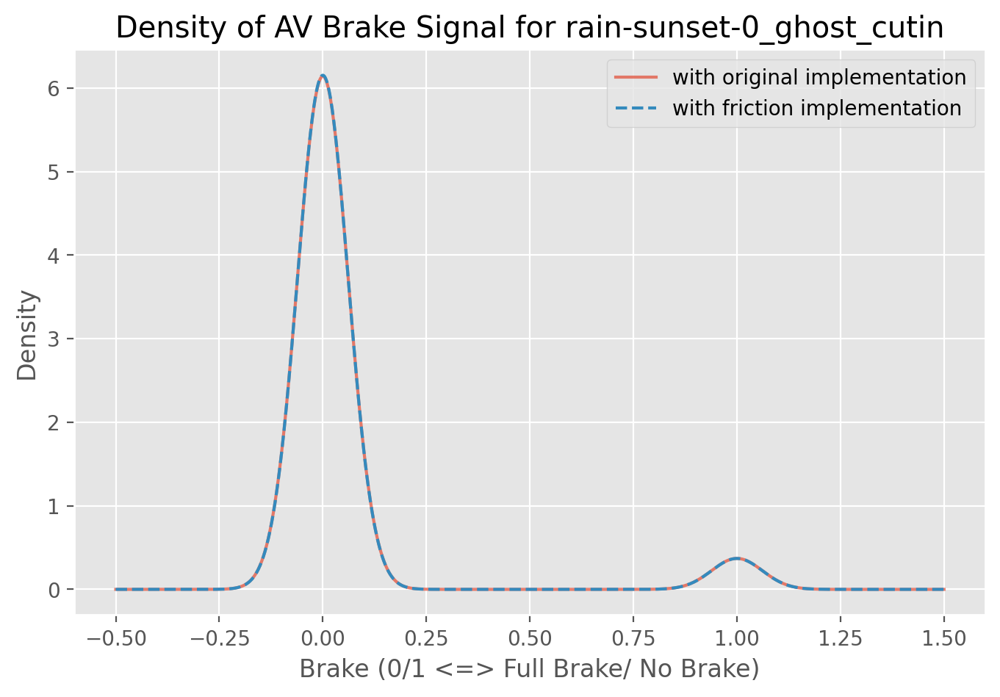

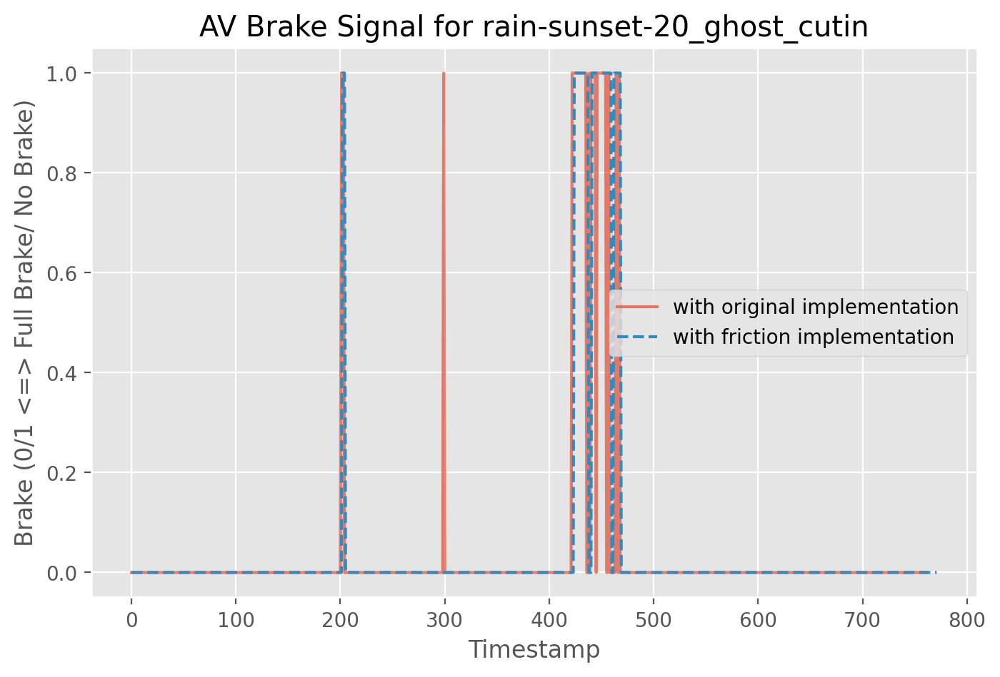

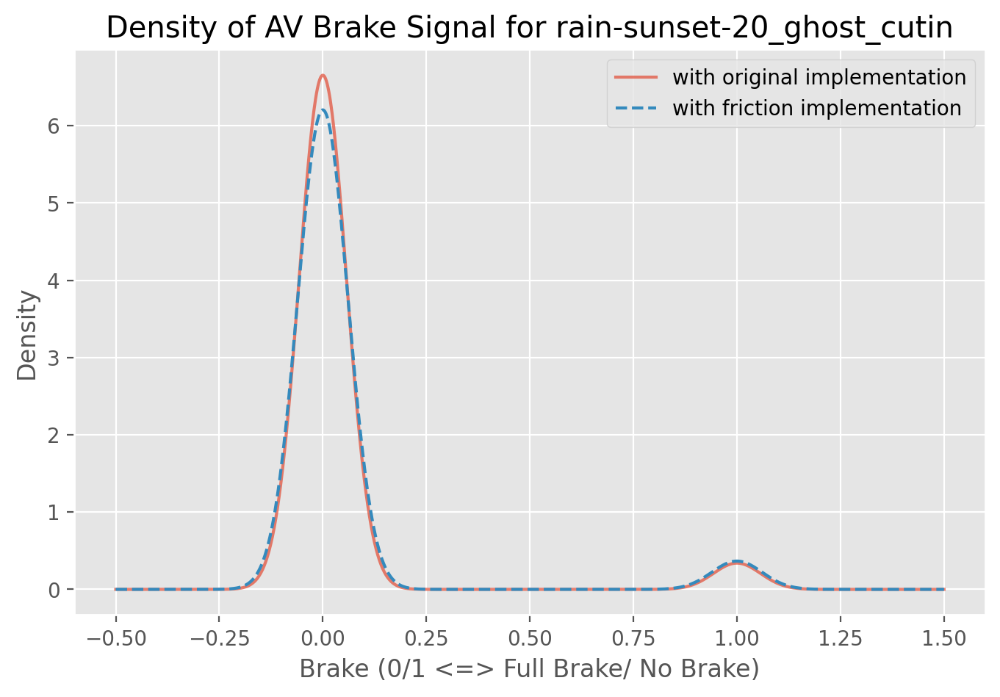

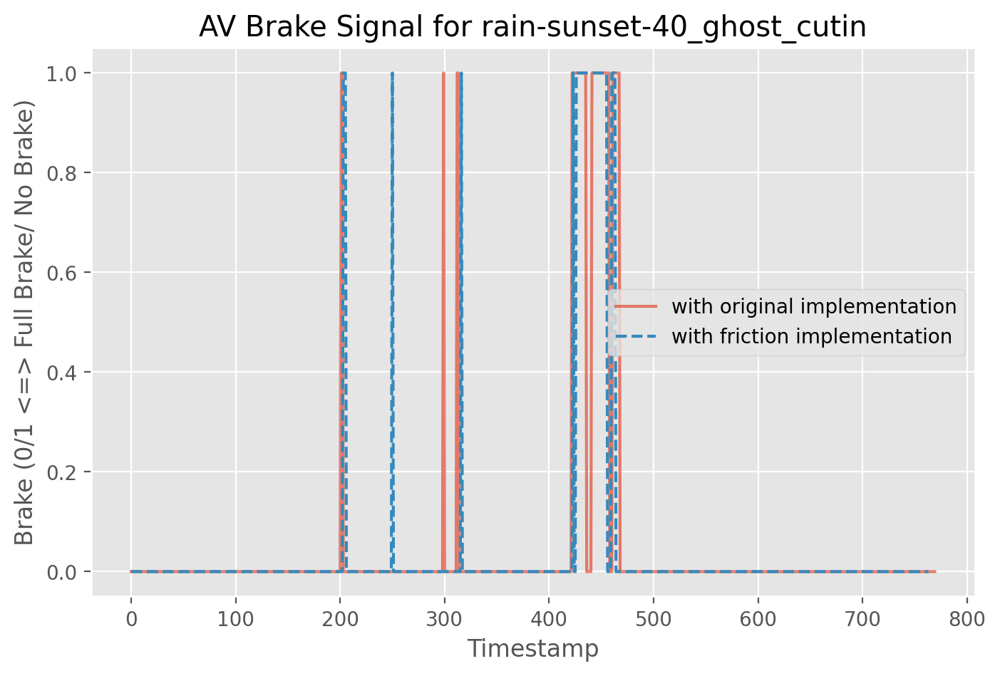

...

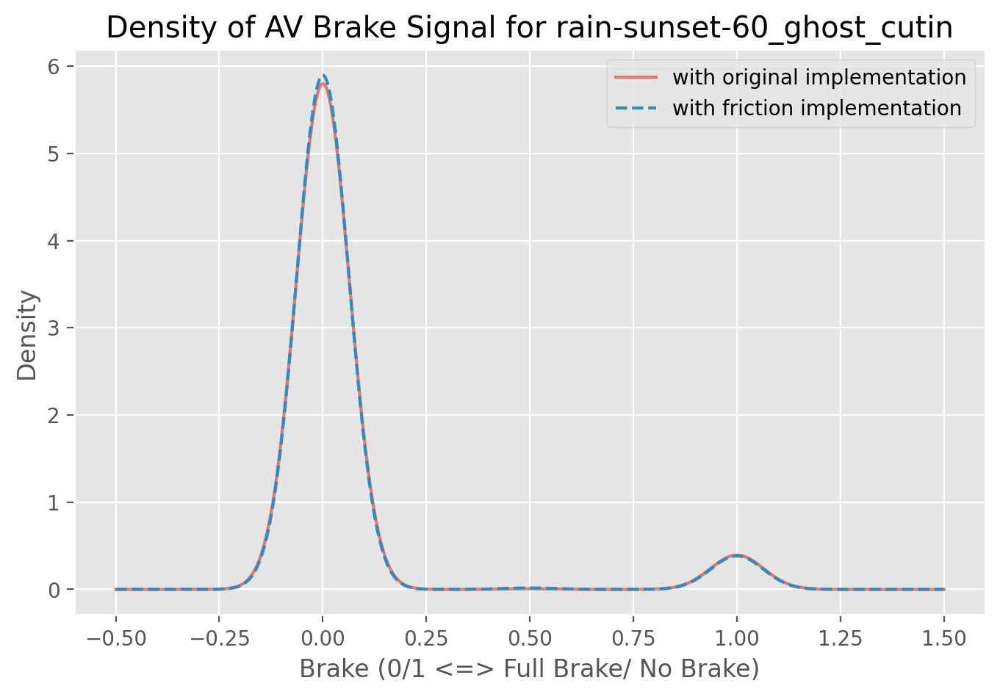

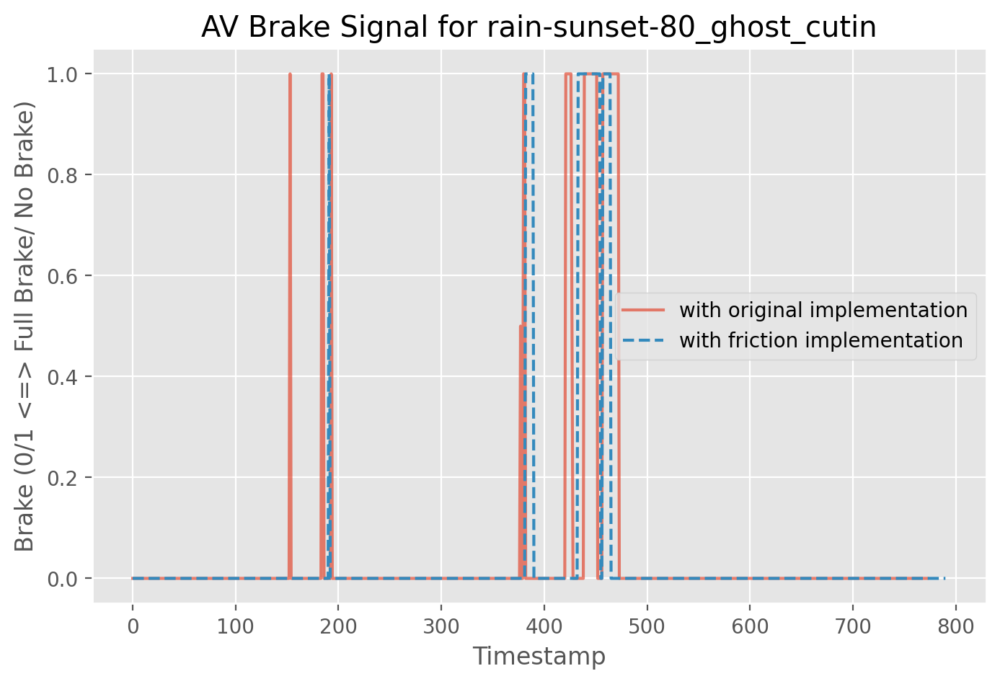

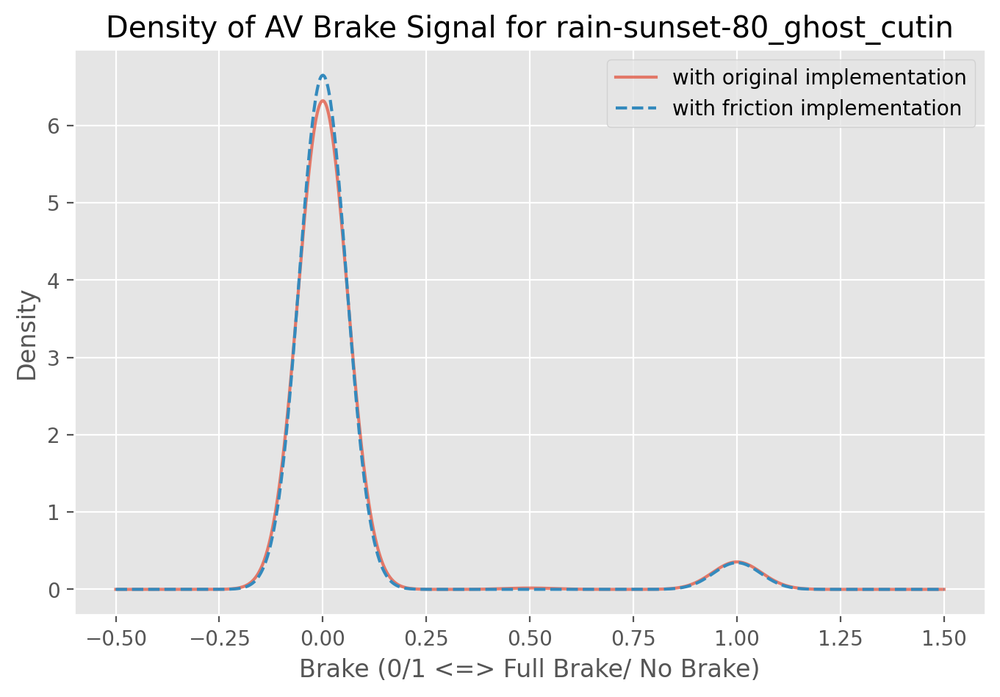

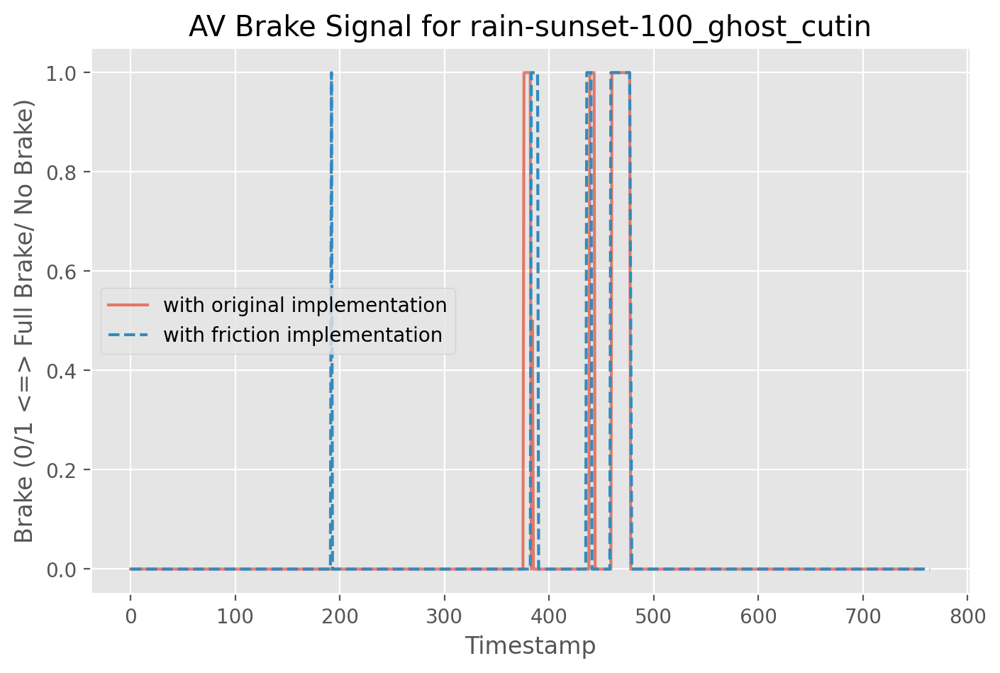

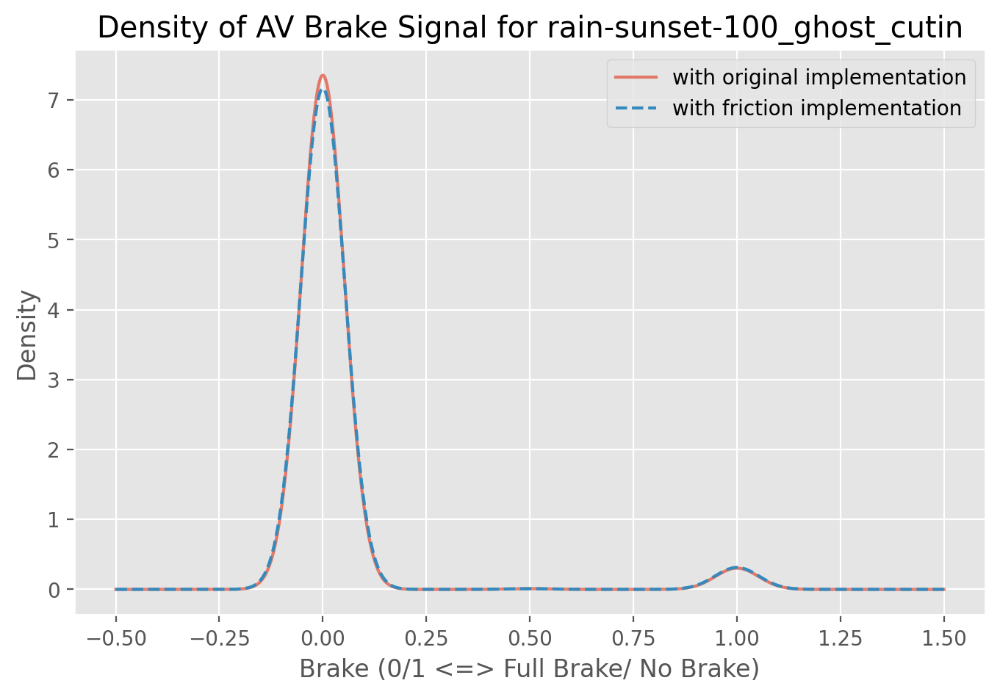

In [47]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)

    plt.plot(median_orig_brake, alpha=0.7)


    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any():
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)
    
    all_medians[weather][5][0] = median_orig_brake
    all_medians[weather][5][1] = median_fric_brake
    
    plt.plot(median_fric_brake, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
    plt.title("AV Brake Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Brake (0/1 <=> Full Brake/ No Brake)")
    plt.ylabel("Density")
    median_orig_brake.plot.density(alpha=0.7)
    median_fric_brake.plot.density(style='--')
    plt.title("Density of AV Brake Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()


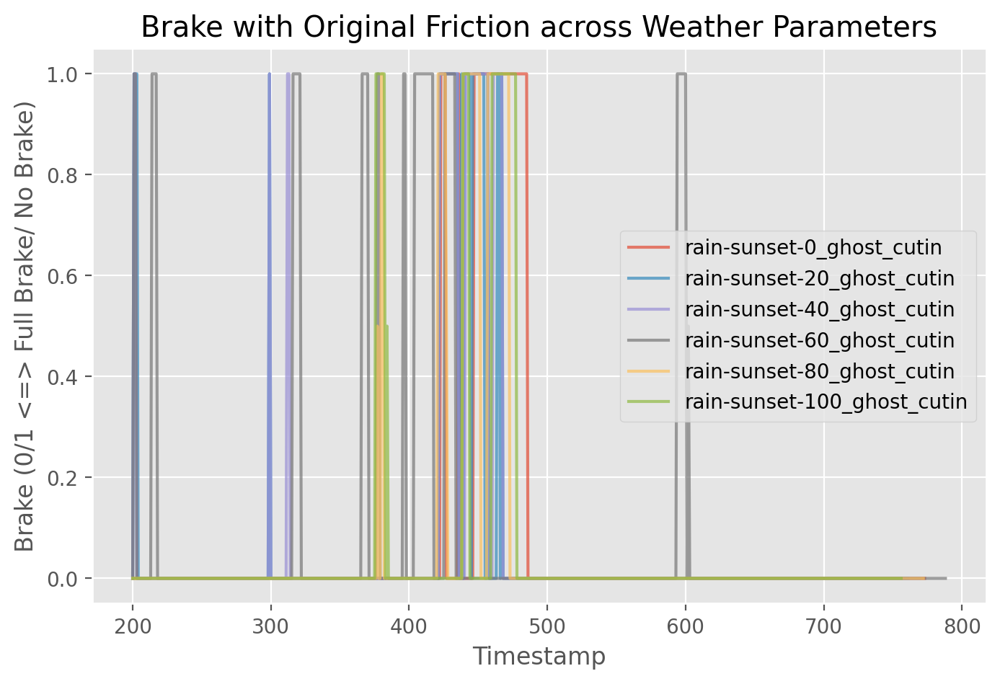

In [48]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'brake'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)


    plt.plot(median_orig_brake[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
plt.title("Brake with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

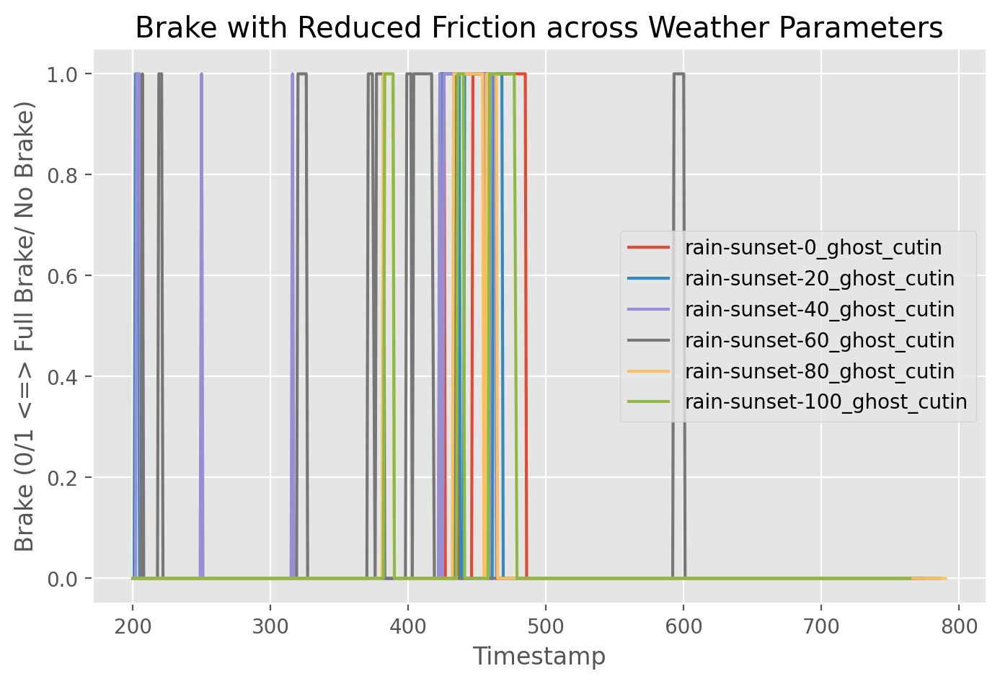

In [49]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any() :
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)

    plt.plot(median_fric_brake[200:])

plt.xlabel("Timestamp")
plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
plt.title("Brake with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

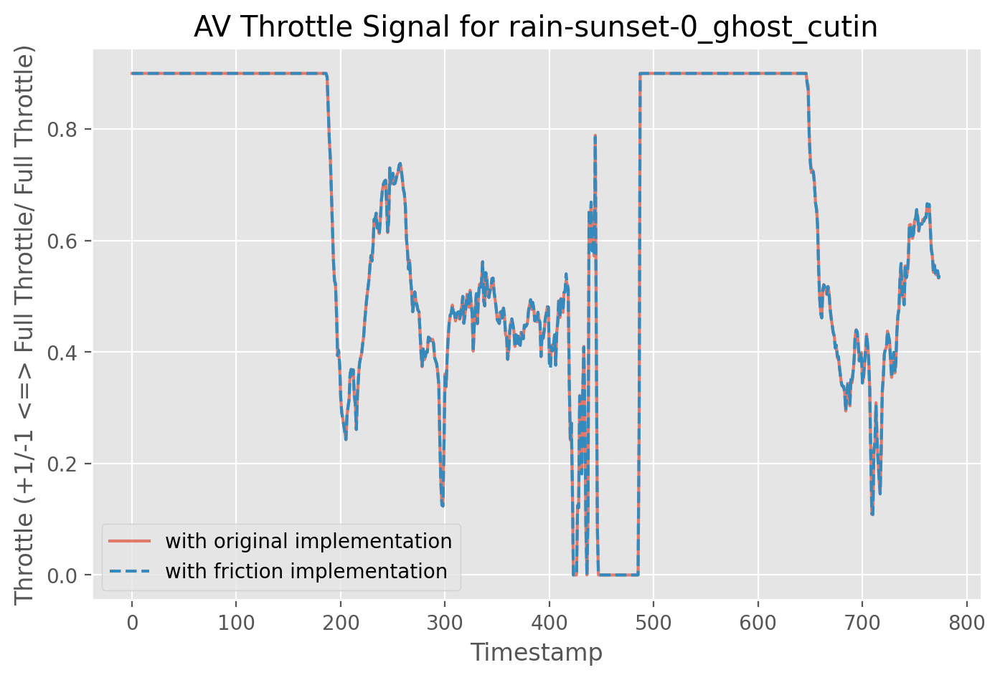

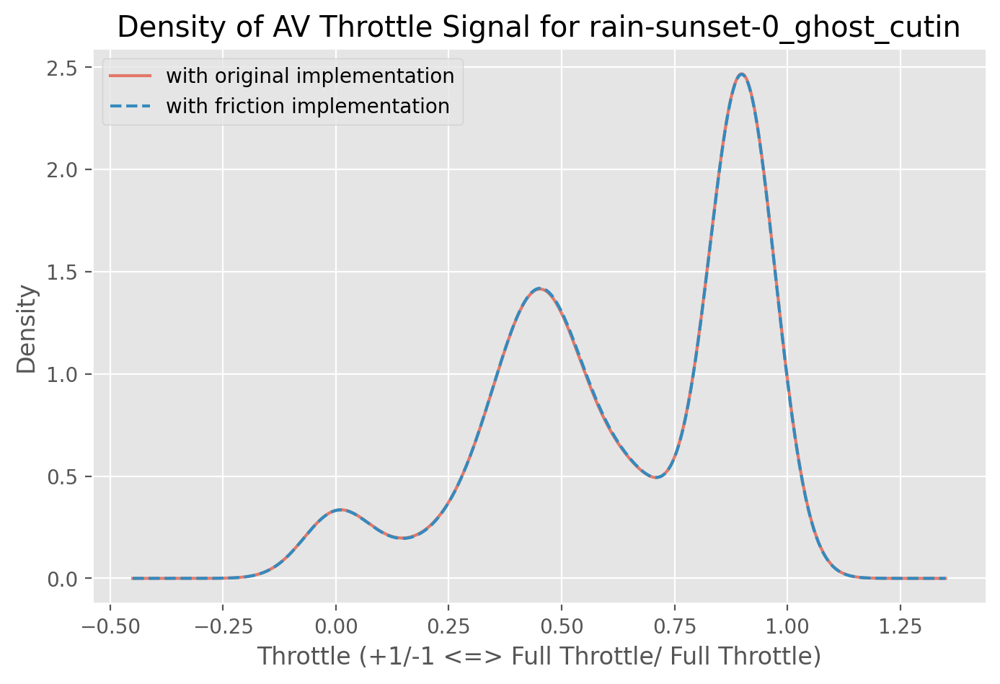

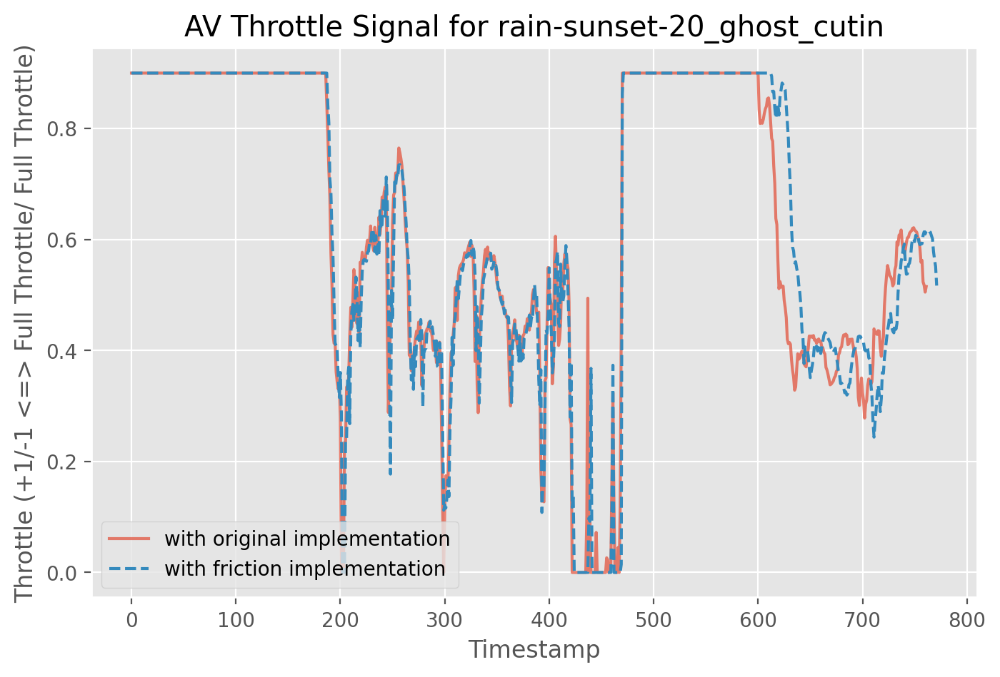

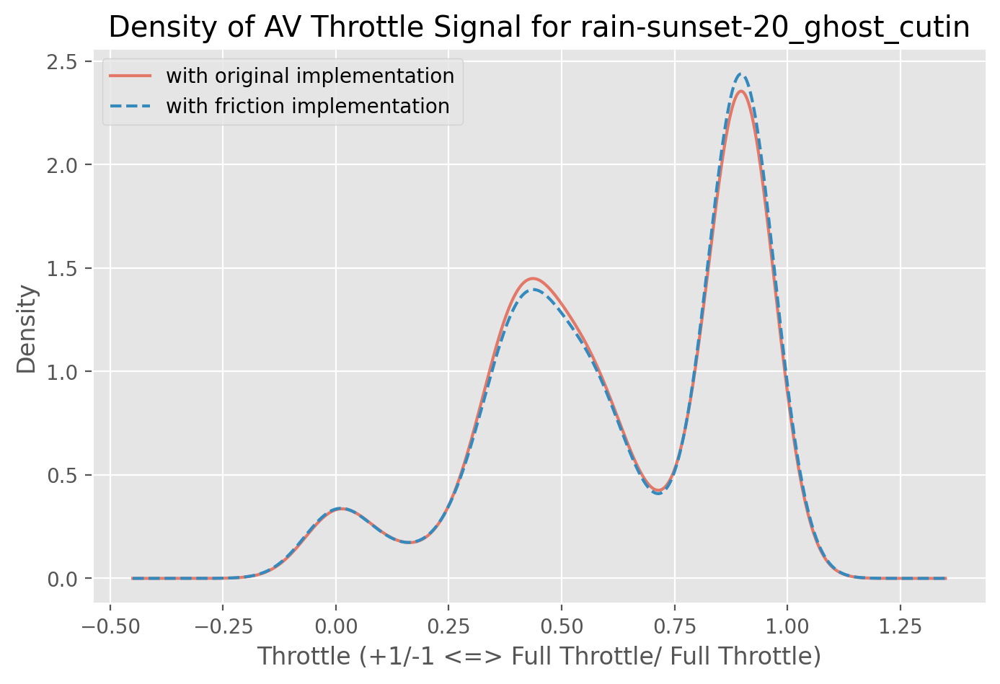

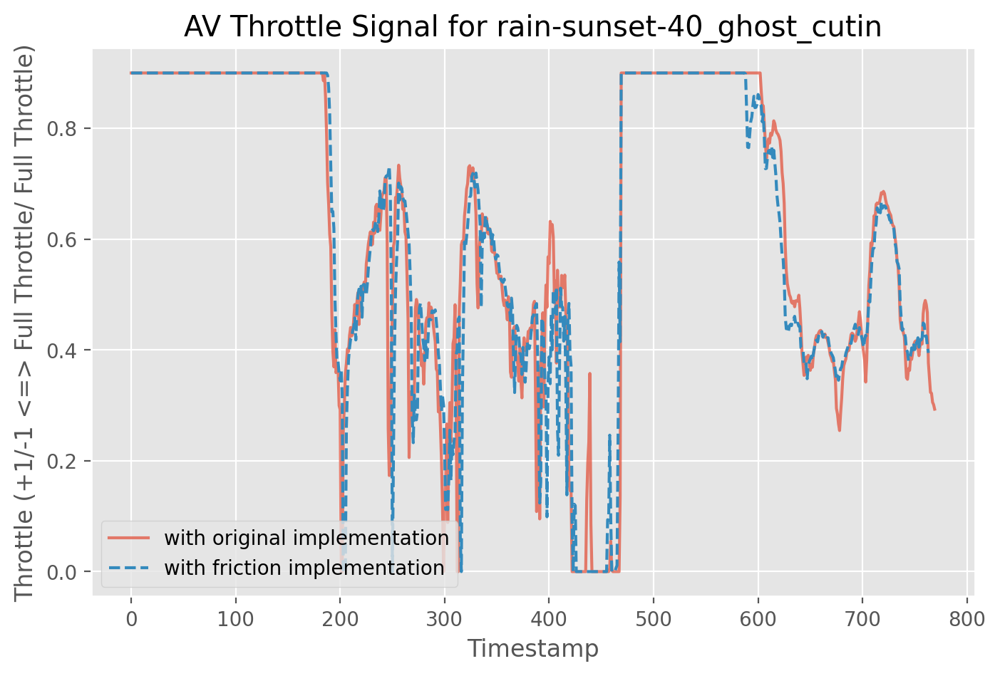

...

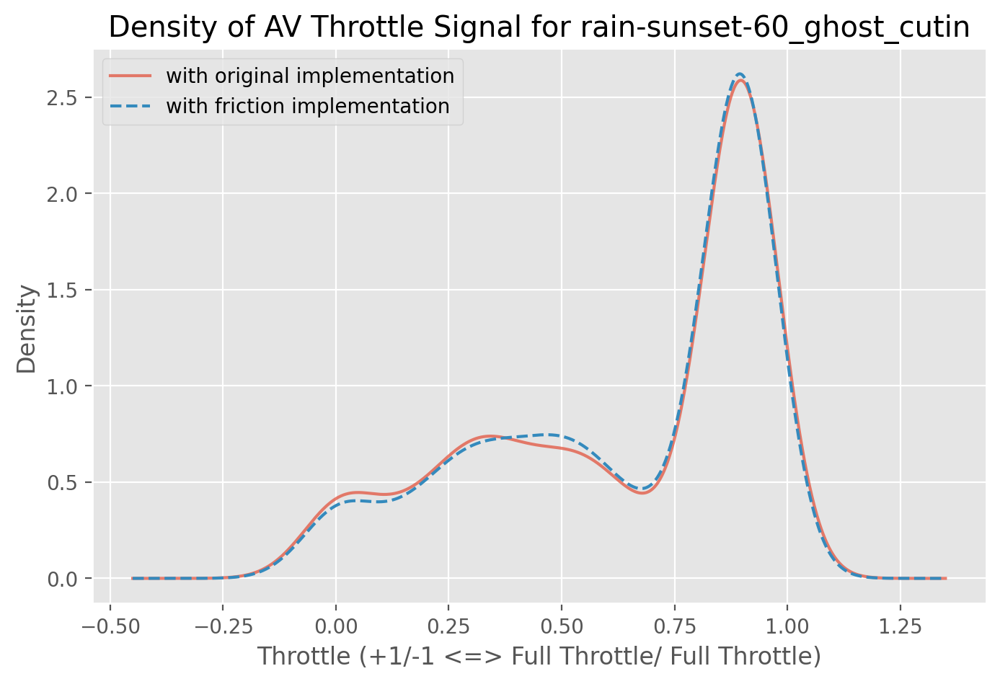

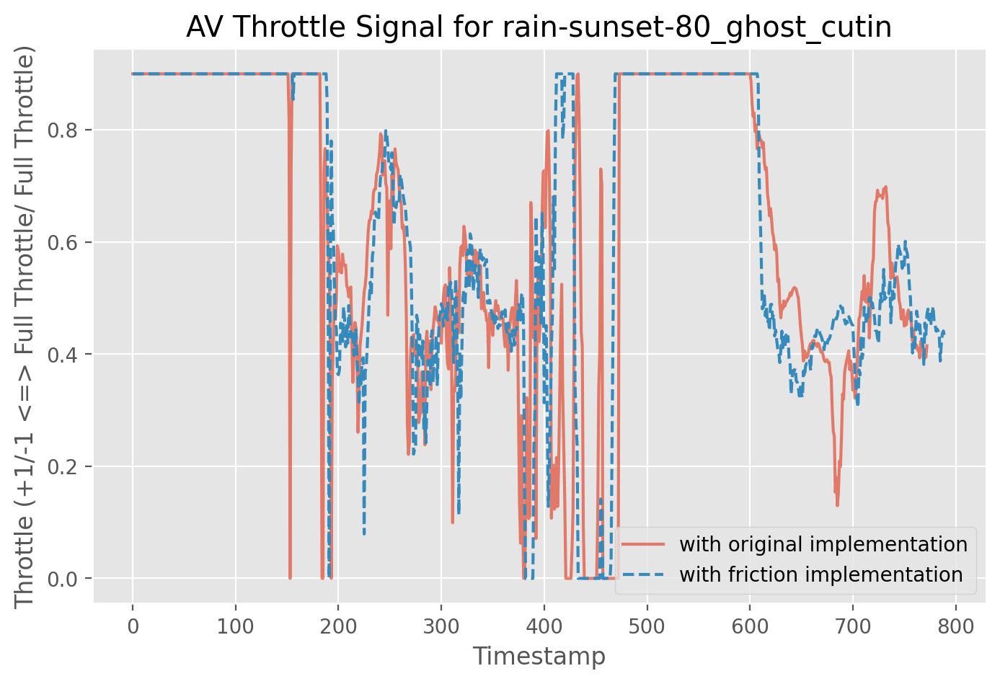

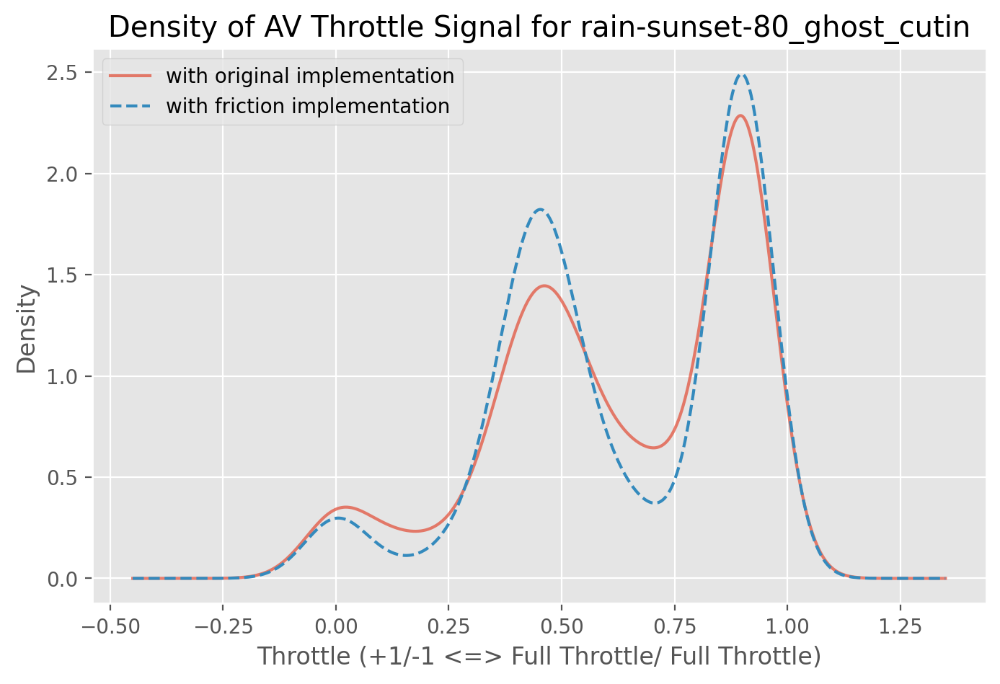

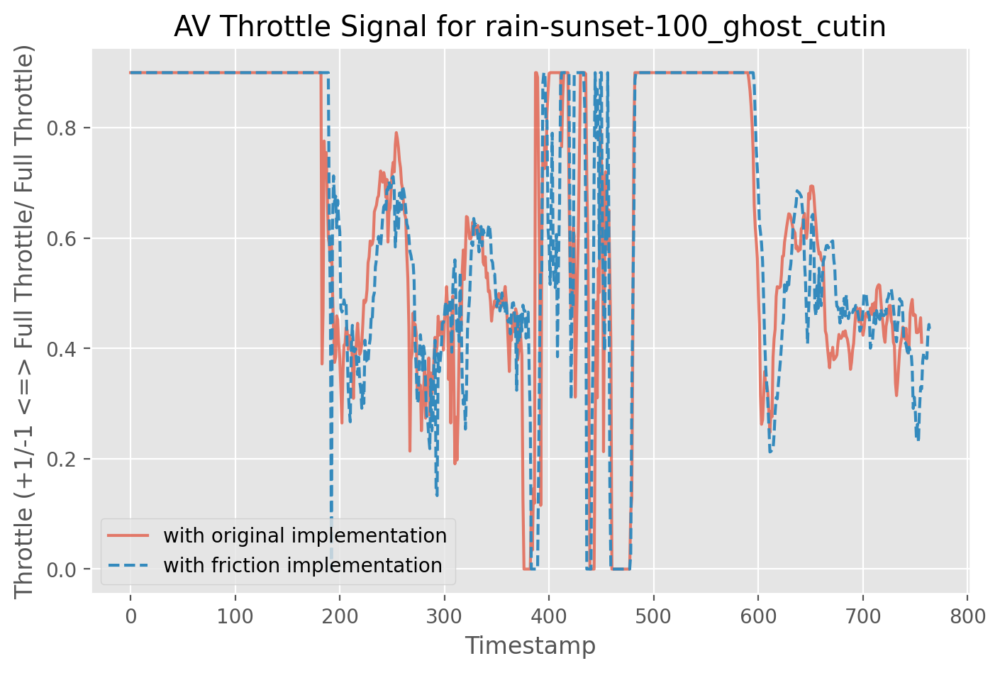

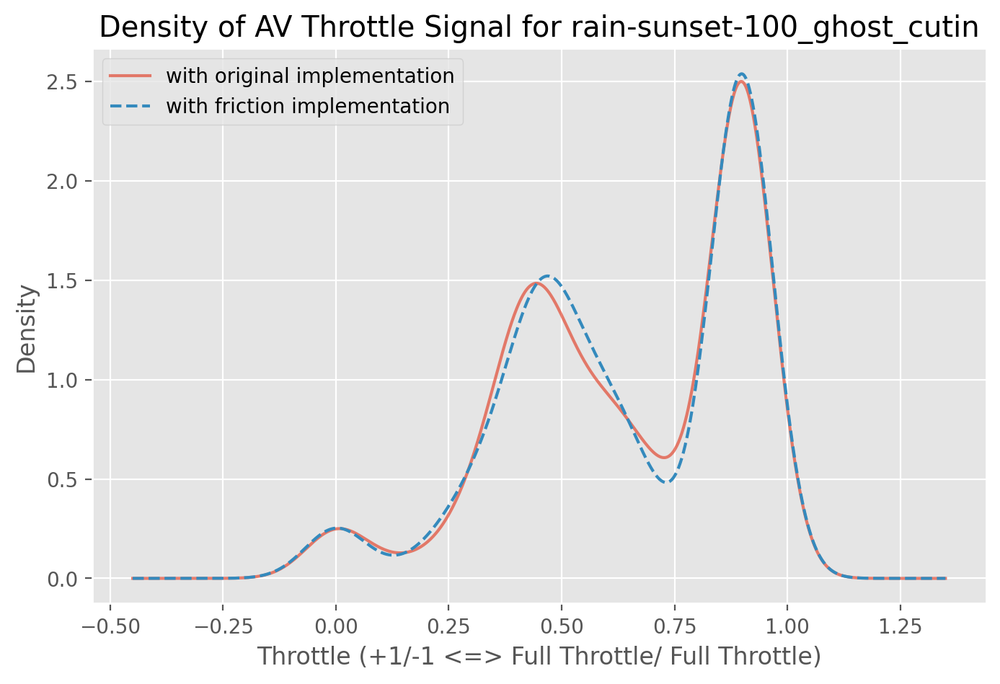

In [50]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)

    plt.plot(median_orig_throttle, alpha=0.7)


    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any():
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)
    
    all_medians[weather][6][0] = median_orig_throttle
    all_medians[weather][6][1] = median_fric_throttle
    
    plt.plot(median_fric_throttle, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
    plt.title("AV Throttle Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
    plt.ylabel("Density")
    median_orig_throttle.plot.density(alpha=0.7)
    median_fric_throttle.plot.density(style='--')
    plt.title("Density of AV Throttle Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

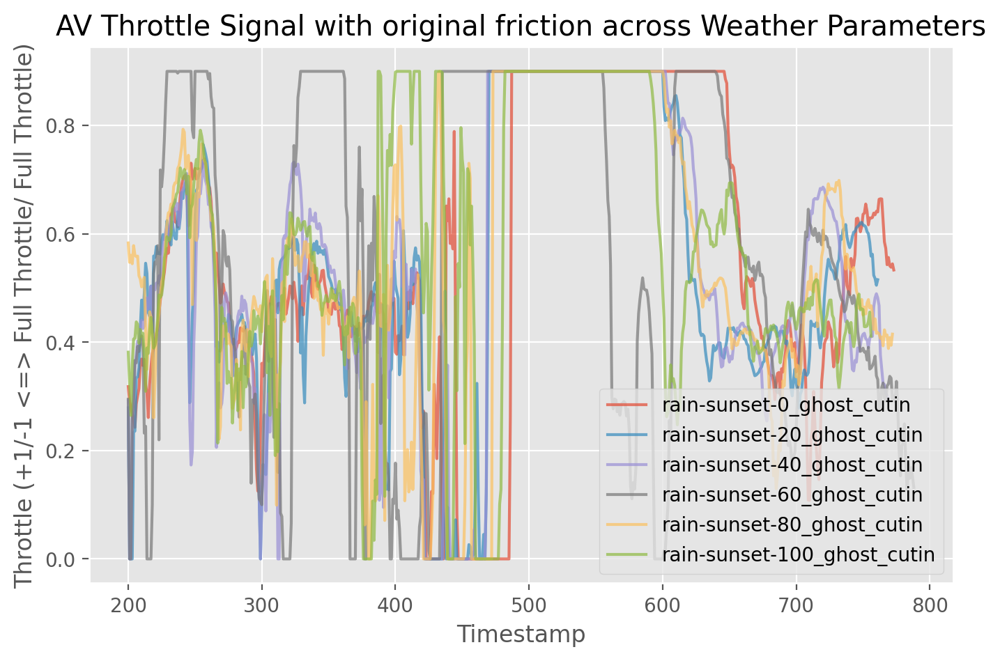

In [51]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'throttle'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)


    plt.plot(median_orig_throttle[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
plt.title("AV Throttle Signal with original friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

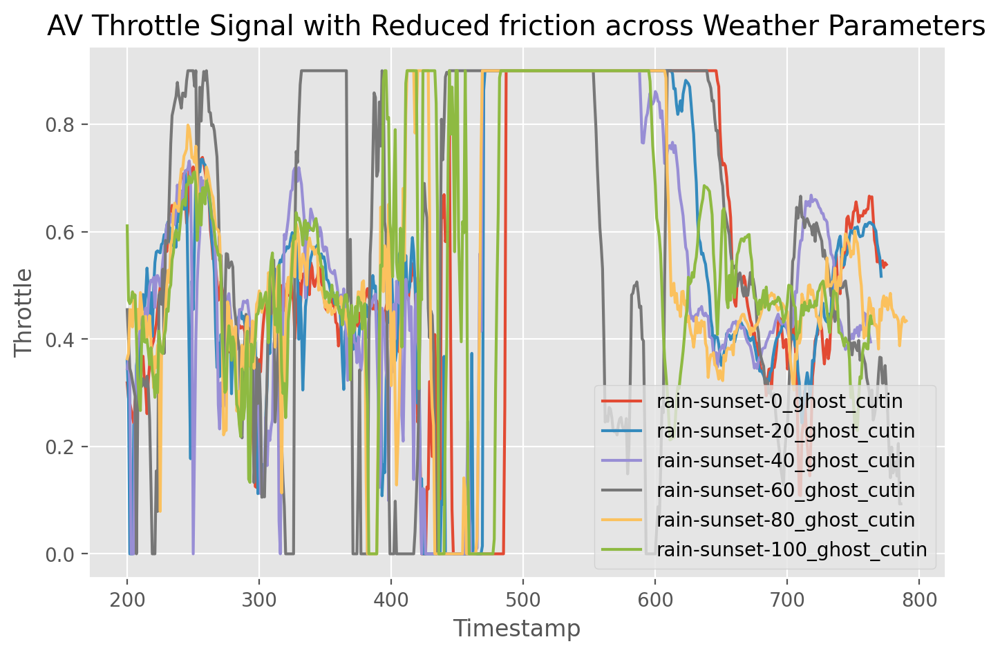

In [52]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any() :
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)

    plt.plot(median_fric_throttle[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with Reduced friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

## Dynamic time warping (DTW) for cvip
### measuring similarity between two temporal sequences

In [53]:
all_dtw = [[0] * len(attribute_order)  for i in range(len(txt_lists_fric))]

for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = dtw.distance(all_medians[i][j][0], all_medians[i][j][1])

In [54]:
for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = round(all_dtw[i][j],2)

In [55]:
df = pd.DataFrame(all_dtw, columns = attribute_order, dtype = float)
df.index = subfolders
df.to_csv("DTW_ghost_cutin_rainy.csv")
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_ghost_cutin,0.00,0.26,0.05,0.87,0.00,0.00,0.05
rain-sunset-20_ghost_cutin,0.05,1.48,4.03,9.78,0.04,2.24,0.68
rain-sunset-40_ghost_cutin,0.09,2.44,1.49,4.54,0.05,0.00,0.92
rain-sunset-60_ghost_cutin,0.11,1.64,3.07,5.10,0.03,0.87,1.11
rain-sunset-80_ghost_cutin,0.26,1.44,1.59,5.06,0.03,2.12,1.87
rain-sunset-100_ghost_cutin,0.25,1.57,1.36,203.96,0.03,1.22,1.38


## KS Test for cvip

In [56]:
import scipy as sp

In [57]:
all_ks = np.empty((len(txt_lists_fric), len(attribute_order), 2))
# [[0] * len(attribute_order)  for i in range(len(txt_lists_fric)-1)]
for i in range(len(txt_lists_fric)-1):
    for j in range(len(attribute_order)):
        ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])
        all_ks[i][j][0] = ks_test.pvalue
        all_ks[i][j][1] = ks_test.statistic

In [58]:
df = pd.DataFrame(all_ks[:,:,0], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_ghost_cutin,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
rain-sunset-20_ghost_cutin,5.799759e-01,1.000000e+00,4.062944e-01,3.610441e-01,8.766824e-01,1.000000e+00,9.663194e-01
rain-sunset-40_ghost_cutin,4.722511e-01,9.046161e-01,4.349282e-01,1.276632e-01,8.013662e-01,1.000000e+00,8.645371e-01
rain-sunset-60_ghost_cutin,3.938870e-01,9.999660e-01,4.049382e-01,3.663945e-01,7.854995e-01,1.000000e+00,8.409295e-01
rain-sunset-80_ghost_cutin,5.391564e-03,6.494528e-01,5.408164e-02,3.618960e-01,1.941208e-01,1.000000e+00,1.299642e-01
rain-sunset-100_ghost_cutin,1.102022e-311,1.102022e-311,1.102022e-311,1.102022e-311,1.102023e-311,1.102023e-311,1.102023e-311


In [59]:
df = pd.DataFrame(all_ks[:,:,1], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
rain-sunset-0_ghost_cutin,7.458909e-03,3.862650e-03,5.234556e-03,7.029356e-03,1.020938e-02,1.465143e-04,6.226857e-03
rain-sunset-20_ghost_cutin,3.912869e-02,9.267948e-03,4.485061e-02,4.655053e-02,2.954456e-02,7.143051e-03,2.473379e-02
rain-sunset-40_ghost_cutin,4.255797e-02,2.833345e-02,4.382947e-02,5.926770e-02,3.226015e-02,3.488135e-03,3.001632e-02
rain-sunset-60_ghost_cutin,4.474807e-02,1.533635e-02,4.423917e-02,4.571595e-02,3.235241e-02,2.380251e-03,3.048750e-02
rain-sunset-80_ghost_cutin,8.636292e-02,3.667390e-02,6.734561e-02,4.608443e-02,5.400830e-02,6.322748e-03,5.852549e-02
rain-sunset-100_ghost_cutin,1.102016e-311,1.102022e-311,1.102022e-311,1.102023e-311,1.102034e-311,1.102031e-311,1.102031e-311
